In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

#### Pivoting data

In [ ]:
raw_water_quality = pd.read_excel('Processed_raw_combined_data.xlsx')
raw_water_quality

,ActivityStartDate,ActivityStartTime/Time,CharacteristicName,ResultMeasureValue,ResultMeasure/MeasureUnitCode
0,2015-01-06,10:18:00,Dissolved Oxygen Saturation (%),101.90,%
1,2015-01-06,10:18:00,Dissolved Oxygen (mg/L),14.56,mg/l
2,2015-02-04,09:55:00,Dissolved Oxygen Saturation (%),97.90,%
3,2015-02-04,09:55:00,Dissolved Oxygen (mg/L),14.10,mg/l
4,2015-03-04,09:52:00,Dissolved Oxygen Saturation (%),95.90,%
...,...,...,...,...,...
283804,2018-04-09,13:45:00,Nitrogen-mixed form (mg/L),1.70,mg/l
283805,2017-02-08,23:06:00,Nitrogen-mixed form (mg/L),1.70,mg/l
283806,2018-08-14,12:37:00,Nitrogen-mixed form (mg/L),2.80,mg/l
283807,2019-10-31,17:50:00,Nitrogen-mixed form (mg/L),6.30,mg/l


In [ ]:
water_quality = pd.pivot_table(data=raw_water_quality, index='ActivityStartDate', columns='CharacteristicName',
                                  values='ResultMeasureValue',aggfunc=np.mean)
water_quality

CharacteristicName,Ammonia (mg/L),Biochemical Oxygen Demand (mg/L),Bromide (mg/L),Calcium (mg/L),Chloride (mg/L),Conductivity (mS/cm),Dissolved Oxygen (mg/L),Dissolved Oxygen Saturation (%),Enterococcus (MPN/100ml),Escherichia coli (cfu/100ml),...,Sodium (mg/L),Specific Conductance (uS/cm),Sulfate (mg/L),Suspended Sediment Concentration (mg/L),Temperature (deg C),Total Dissolved Solids (mg/L),Total Solids (mg/L),Total Suspended Solids (mg/L),Turbidity (NTU),pH
ActivityStartDate,,,,,,,,,,,,,,,,,,,,,
2015-01-01,NaN,NaN,NaN,1.710000,0.516000,NaN,NaN,NaN,NaN,NaN,...,0.303000,16.000000,2.800000,NaN,0.100000,NaN,NaN,NaN,NaN,6.190000
2015-01-02,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,226.500000,NaN,NaN,NaN,NaN,NaN,NaN
2015-01-03,0.043333,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,248.490566,NaN,NaN,NaN,NaN,NaN,NaN
2015-01-04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,1378.666667,NaN,NaN,NaN,NaN,NaN,NaN
2015-01-05,0.094421,1.2,NaN,18.245714,35.821429,NaN,13.637826,94.392857,1733.166667,NaN,...,17.207143,265.214286,18.771429,2434.658333,4.567857,NaN,NaN,7.761905,11.142857,7.605263
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2019-12-27,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,119.200000,NaN,NaN,NaN,NaN,NaN,NaN
2019-12-28,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,132.916667,NaN,NaN,NaN,NaN,NaN,NaN
2019-12-29,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,186.214286,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
len(water_quality.columns)  ## 29 water quality features

29

As per literature review, only the following parameters are used to find Water Quality Index.
Thus, we will be keeping only those features
- Sulphate, Chloride, Sodium, Potassium, Calcium, Magnesium, TDS, Turbidity, Temp, pH, Dissolved Oxygen,Nitrate, Biochemical Oxygen Demand & Fecal Coliform

In [ ]:
## Keep only columns of above given features
water_quality = water_quality[['Sulfate (mg/L)','Chloride (mg/L)','Sodium (mg/L)','Potassium (mg/L)', 'Calcium (mg/L)',
                              'Magnesium (mg/L)','Total Dissolved Solids (mg/L)','Turbidity (NTU)','Temperature (deg C)',
                              'pH', 'Dissolved Oxygen (mg/L)', 'Nitrate (mg/L)',
                               'Biochemical Oxygen Demand (mg/L)', 'Fecal Coliform (cfu/100ml)']]
water_quality

CharacteristicName,Sulfate (mg/L),Chloride (mg/L),Sodium (mg/L),Potassium (mg/L),Calcium (mg/L),Magnesium (mg/L),Total Dissolved Solids (mg/L),Turbidity (NTU),Temperature (deg C),pH,Dissolved Oxygen (mg/L),Nitrate (mg/L),Biochemical Oxygen Demand (mg/L),Fecal Coliform (cfu/100ml)
ActivityStartDate,,,,,,,,,,,,,,
2015-01-01,2.800000,0.516000,0.303000,0.148000,1.710000,0.391000,NaN,NaN,0.100000,6.190000,NaN,NaN,NaN,NaN
2015-01-02,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2015-01-03,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2015-01-04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2015-01-05,18.771429,35.821429,17.207143,4.189286,18.245714,7.371429,NaN,11.142857,4.567857,7.605263,13.637826,0.7200,1.2,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2019-12-27,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2019-12-28,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2019-12-29,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# water_quality.drop_duplicates()

In [ ]:
len(water_quality.columns)  ## Now only 15 water quality features required for WQI calculation

14

#### Plotting time-series graph of all parameters (Pre-processed)

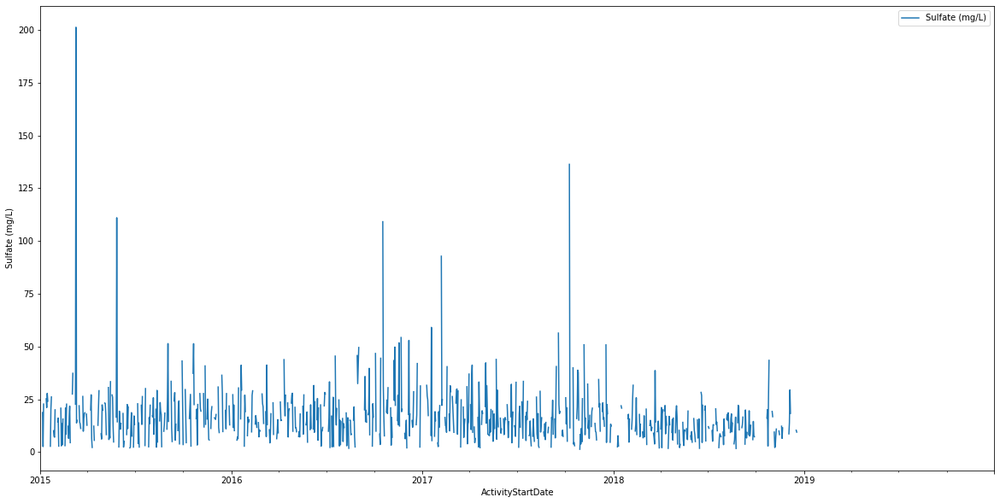

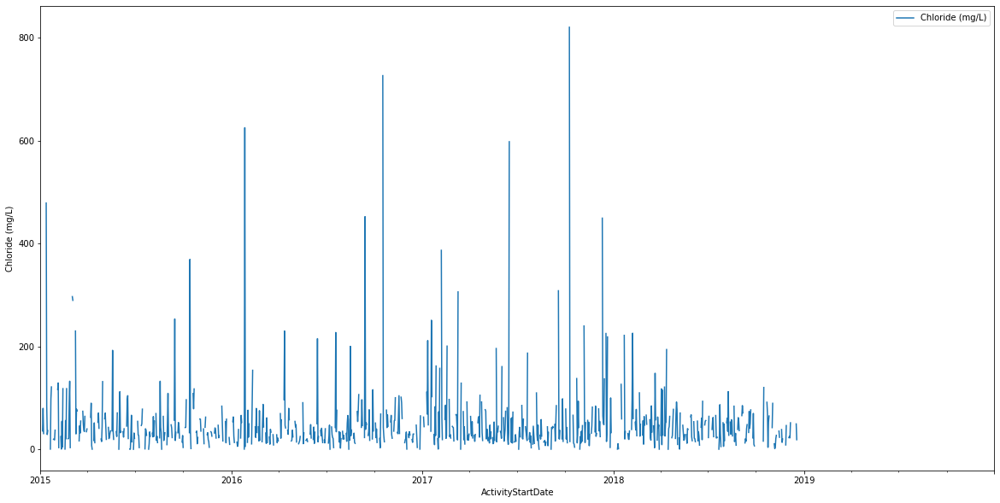

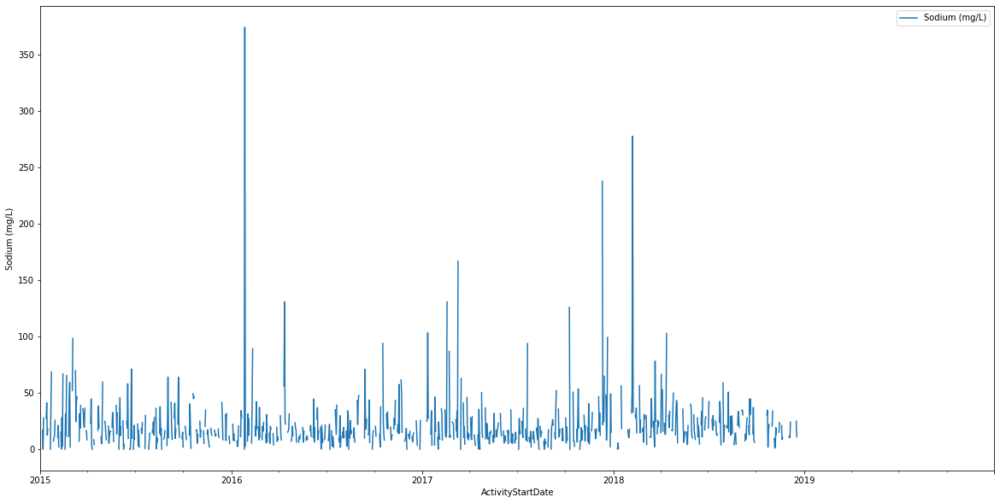

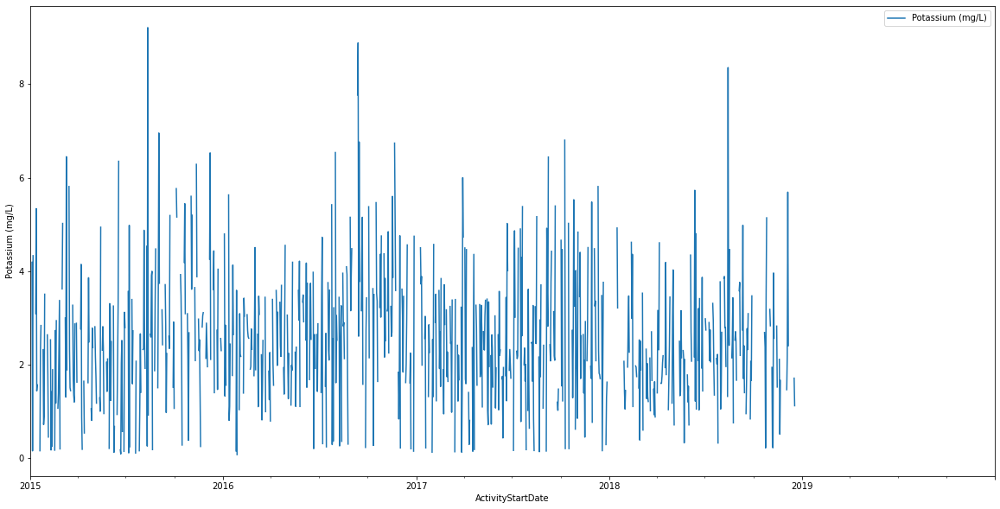

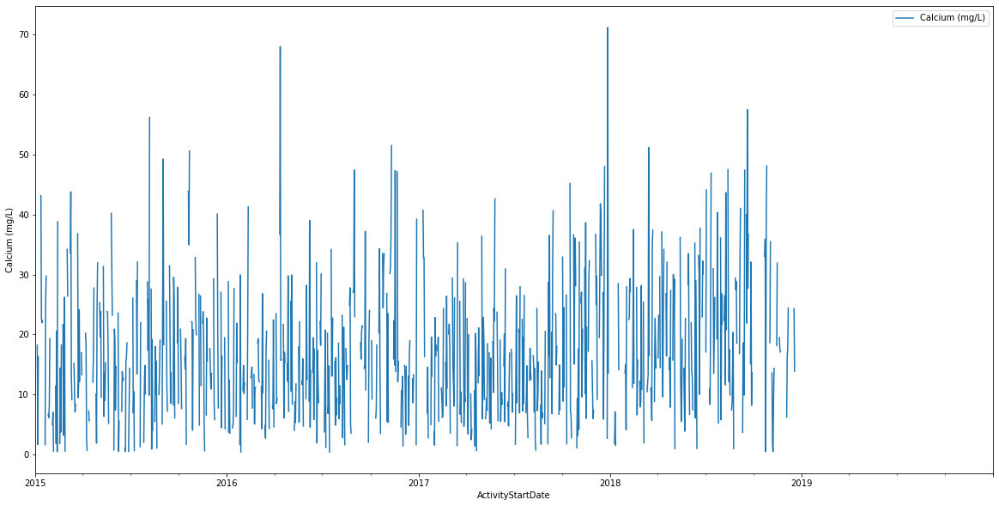

...

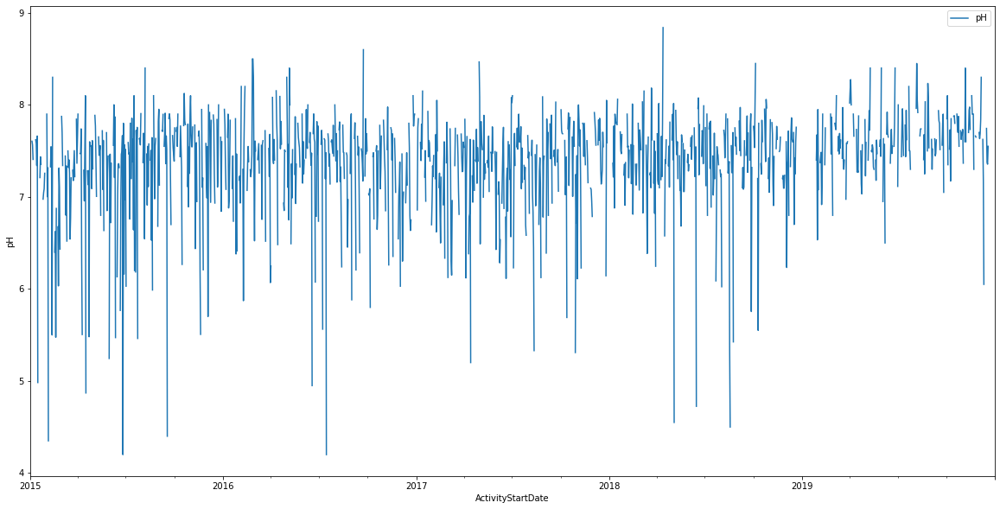

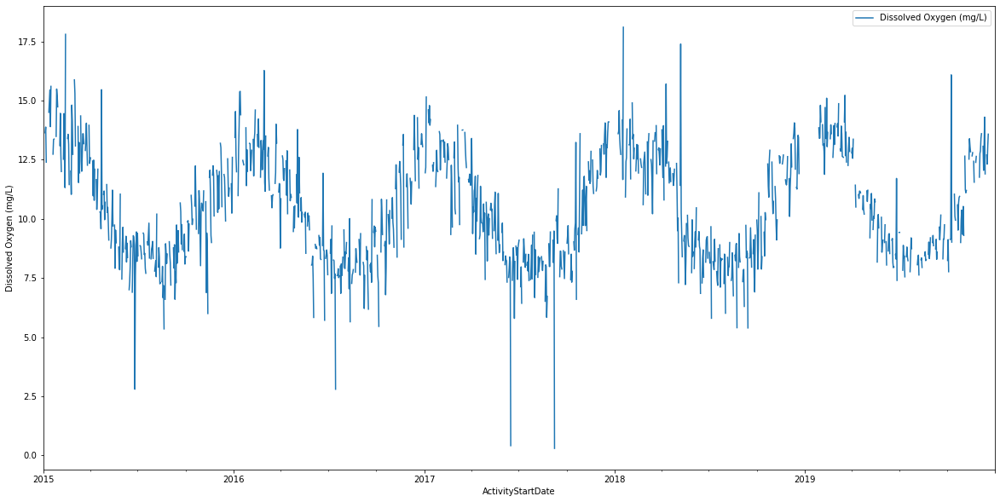

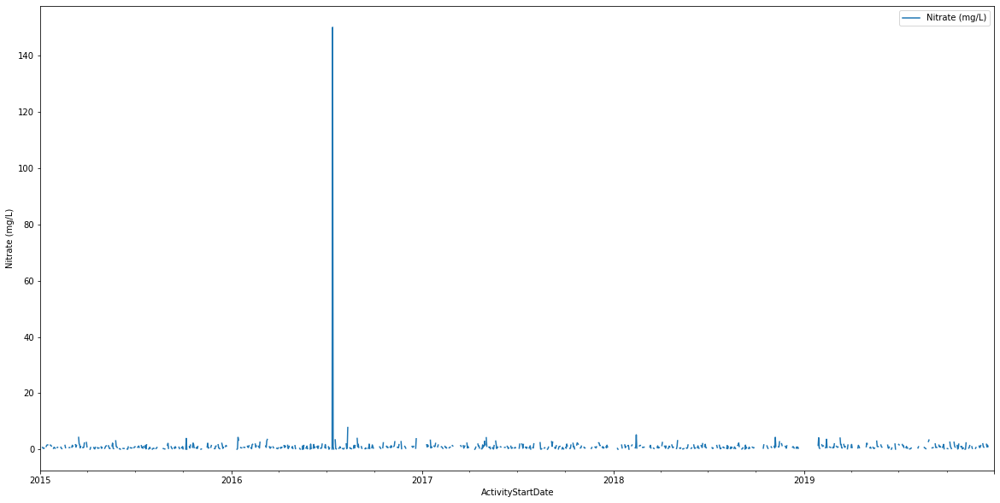

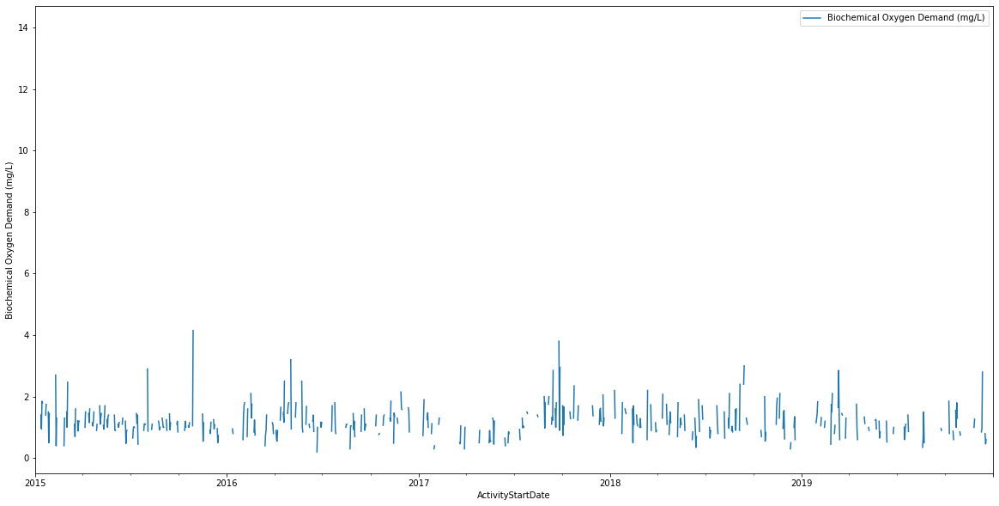

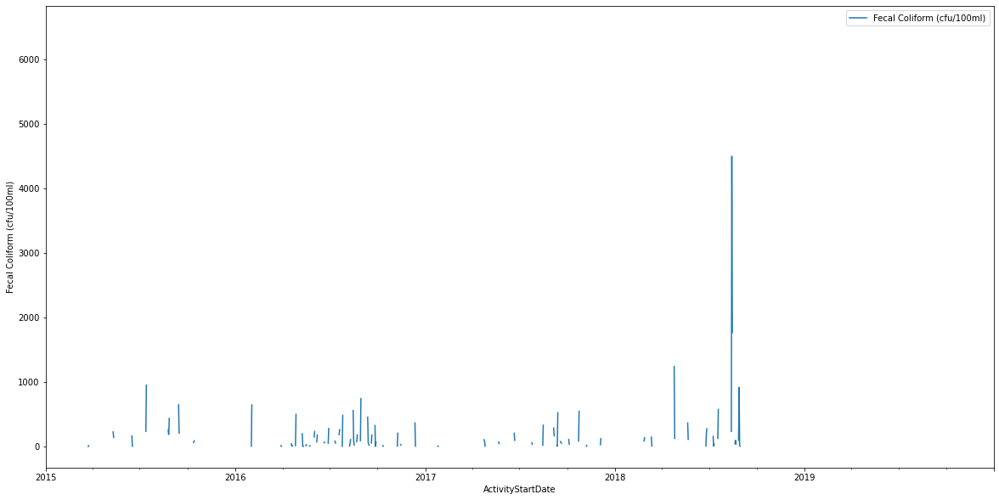

In [ ]:
for column in list(water_quality.columns):
    fig, ax = plt.subplots(figsize=(20,10))
    water_quality.plot(y=column,ax=ax)
    plt.ylabel(column)


### Understanding our data

In [ ]:
water_quality.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 1826 entries, 2015-01-01 to 2019-12-31
Data columns (total 14 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   Sulfate (mg/L)                    798 non-null    float64
 1   Chloride (mg/L)                   814 non-null    float64
 2   Sodium (mg/L)                     792 non-null    float64
 3   Potassium (mg/L)                  780 non-null    float64
 4   Calcium (mg/L)                    792 non-null    float64
 5   Magnesium (mg/L)                  792 non-null    float64
 6   Total Dissolved Solids (mg/L)     729 non-null    float64
 7   Turbidity (NTU)                   790 non-null    float64
 8   Temperature (deg C)               932 non-null    float64
 9   pH                                1171 non-null   float64
 10  Dissolved Oxygen (mg/L)           1166 non-null   float64
 11  Nitrate (mg/L)                    829 non-null    f

In [ ]:
water_quality.describe()

CharacteristicName,Sulfate (mg/L),Chloride (mg/L),Sodium (mg/L),Potassium (mg/L),Calcium (mg/L),Magnesium (mg/L),Total Dissolved Solids (mg/L),Turbidity (NTU),Temperature (deg C),pH,Dissolved Oxygen (mg/L),Nitrate (mg/L),Biochemical Oxygen Demand (mg/L),Fecal Coliform (cfu/100ml)
count,798.000000,814.000000,792.000000,780.000000,792.000000,792.000000,729.000000,790.000000,932.000000,1171.000000,1166.000000,829.000000,543.000000,229.000000
mean,16.455448,50.605615,21.245232,2.475665,16.812622,6.208383,184.836320,25.224844,12.977546,7.364878,10.442325,1.140442,1.220512,258.492695
std,13.945393,69.806377,25.134232,1.467390,11.533321,4.941454,210.798125,78.246404,7.205602,0.576758,2.281376,5.240344,0.806973,655.146580
min,1.377500,0.216000,0.239000,0.074000,0.422000,0.207000,10.015000,0.300000,-0.050000,4.200000,0.300000,0.045000,0.200000,3.000000
25%,8.354375,19.489208,9.381500,1.471208,7.742143,2.426908,72.447500,3.310833,6.409559,7.188434,8.598045,0.450000,0.900000,20.000000
50%,14.305000,33.637857,15.841111,2.328611,14.910186,5.062727,121.463462,6.045000,13.546387,7.480714,10.215000,0.740000,1.100000,80.000000
75%,21.274359,57.175000,25.822063,3.334050,23.502982,8.780800,215.775000,11.798000,19.244643,7.700000,12.345417,1.220000,1.400000,210.000000
max,201.272727,820.133333,374.500000,9.210000,71.200000,38.300000,1962.532500,830.000000,29.000000,8.840000,18.100000,150.125000,14.000000,6500.000000


### Outlier Analysis

- Checking extreme outlier of each parameter and setting those values to maximum threshold defined

<AxesSubplot:>

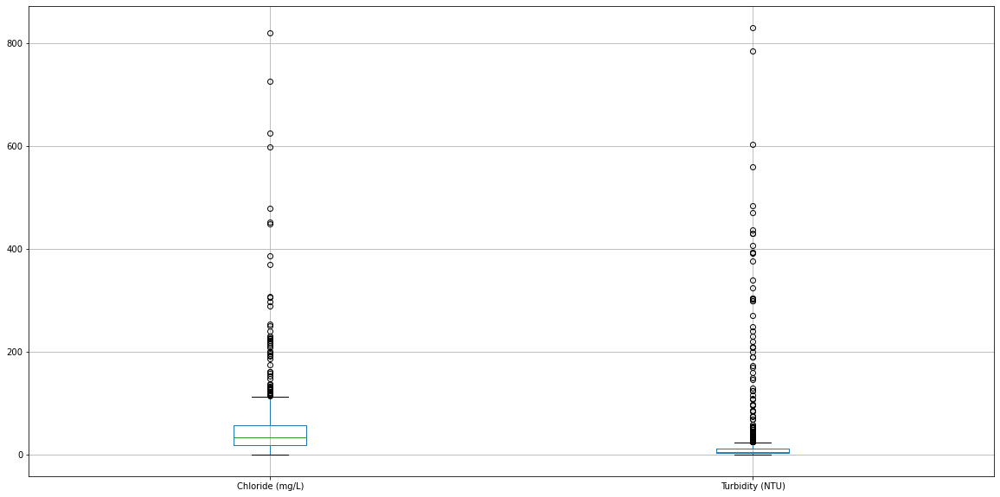

In [ ]:
water_quality.boxplot(column=['Chloride (mg/L)', 'Turbidity (NTU)'],figsize=(20,10))

# Chloride > 280 and Turbidity > 300 seems extreme outliers
# len(water_quality[water_quality['Turbidity (NTU)']>300])

<AxesSubplot:>

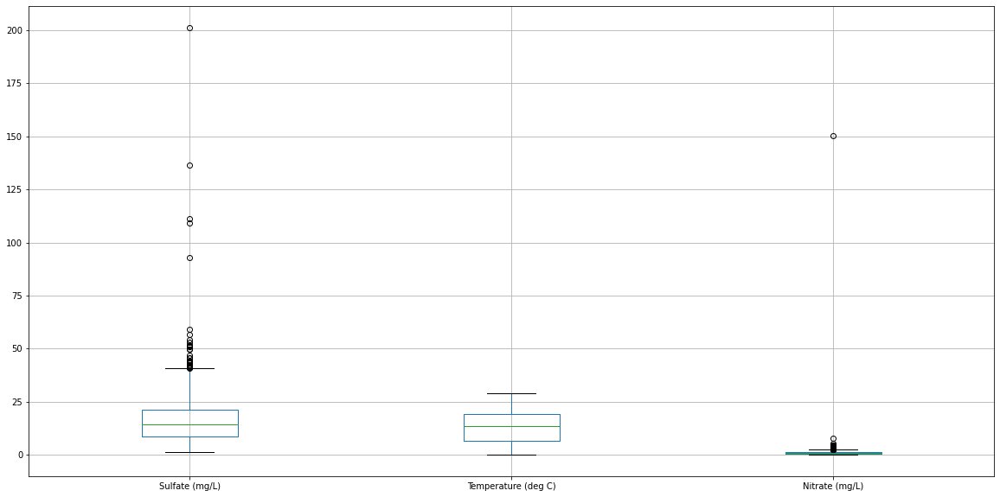

In [ ]:
water_quality.boxplot(column=['Sulfate (mg/L)', 'Temperature (deg C)', 'Nitrate (mg/L)'],figsize=(20,10))

# Sulfate > 60 & Nitrate>5
# len(water_quality[water_quality['Sulfate (mg/L)']>60])
# len(water_quality[water_quality['Nitrate (mg/L)']>5])

<AxesSubplot:>

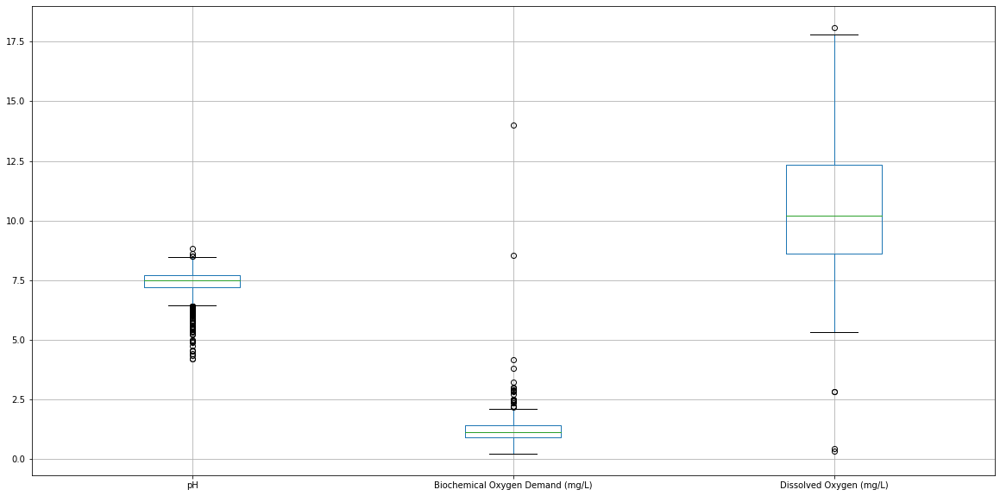

In [ ]:
water_quality.boxplot(column=['pH','Biochemical Oxygen Demand (mg/L)','Dissolved Oxygen (mg/L)'],figsize=(20,10))

# # BOD > 3.5 and DO<2.5
# len(water_quality[water_quality['Biochemical Oxygen Demand (mg/L)']>3.5])
# len(water_quality[water_quality['Dissolved Oxygen (mg/L)']<2.5])

<AxesSubplot:>

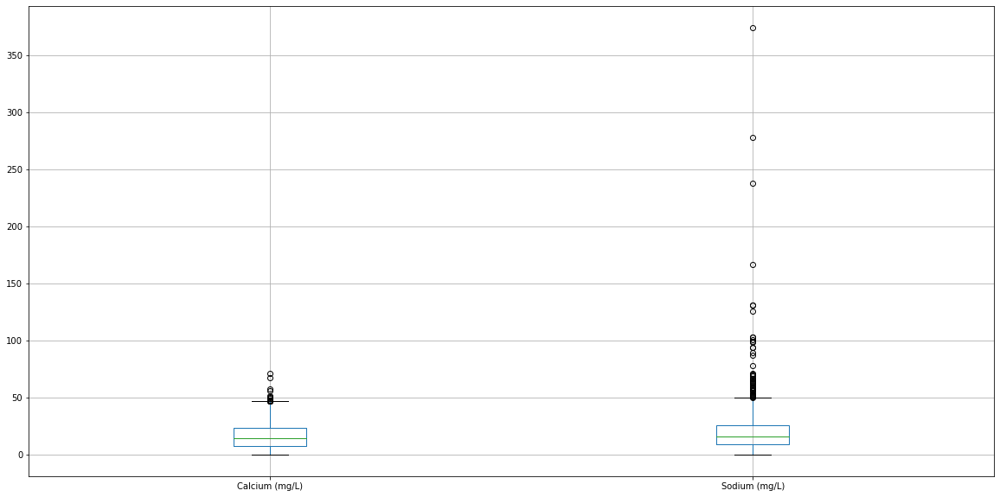

In [ ]:
water_quality.boxplot(column=['Calcium (mg/L)','Sodium (mg/L)'],figsize=(20,10))

# Calcium > 60,  Sodium > 110
# len(water_quality[water_quality['Calcium (mg/L)']>60])
# len(water_quality[water_quality['Sodium (mg/L)']>110])

<AxesSubplot:>

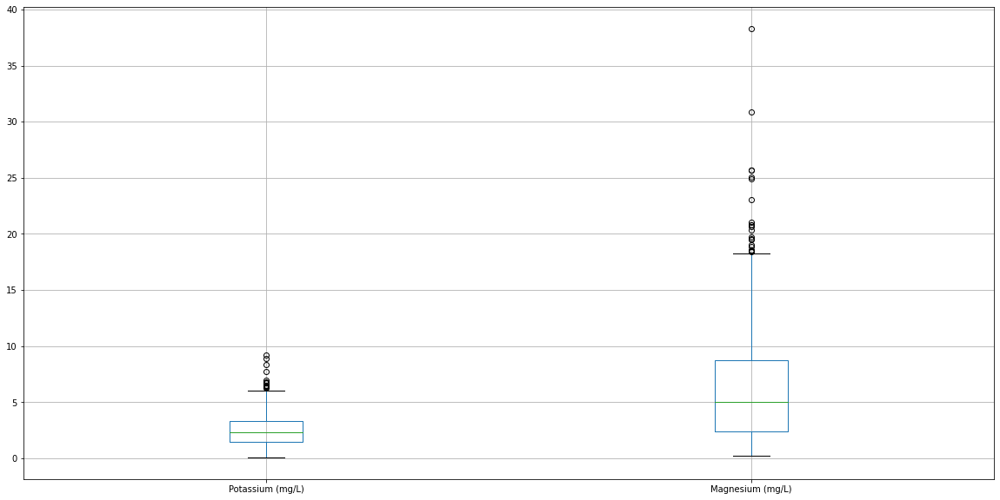

In [ ]:
water_quality.boxplot(column=['Potassium (mg/L)', 'Magnesium (mg/L)'],
                              figsize=(20,10))

# Magnesium > 22,  Potassium > 7.5
# len(water_quality[water_quality['Magnesium (mg/L)']>22])

<AxesSubplot:>

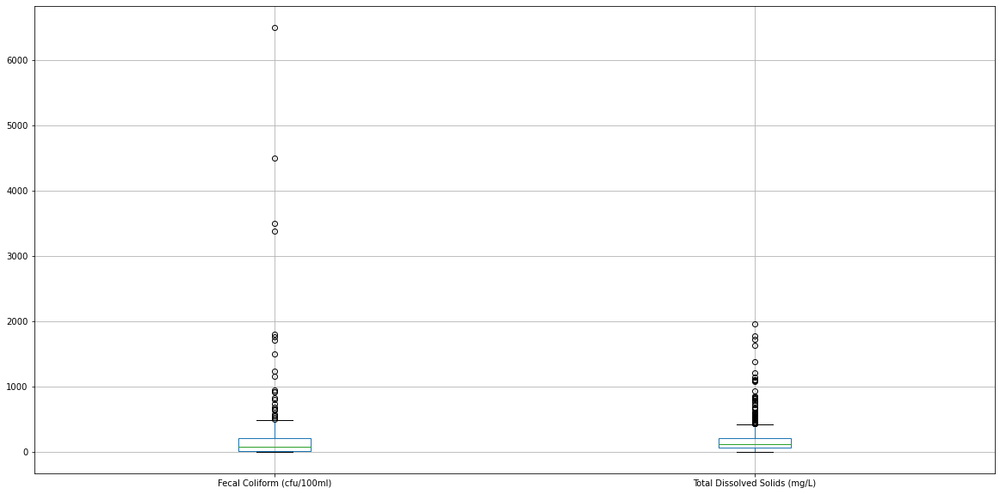

In [ ]:
water_quality.boxplot(column=['Fecal Coliform (cfu/100ml)', 'Total Dissolved Solids (mg/L)'],
                              figsize=(20,10))

# Fecal Coliform > 900,  Total Dissolved Solids > 800
# len(water_quality[water_quality['Total Dissolved Solids (mg/L)']>800])
# len(water_quality[water_quality['Fecal Coliform (cfu/100ml)']>900])

##### Handling outliers

In [ ]:
## Values above these limits for respective parameters will be convereted to current max. value of that column

# len(water_quality[water_quality['Chloride (mg/L)']>280])
# len(water_quality[water_quality['Turbidity (NTU)']>300])

# len(water_quality[water_quality['Sulfate (mg/L)']>60])

# len(water_quality[water_quality['Biochemical Oxygen Demand (mg/L)']>3.5])
# len(water_quality[water_quality['Dissolved Oxygen (mg/L)']<2.5])

# len(water_quality[water_quality['Nitrate (mg/L)']>5])

# len(water_quality[water_quality['Calcium (mg/L)']>60])
# len(water_quality[water_quality['Sodium (mg/L)']>110])

# len(water_quality[water_quality['Potassium (mg/L)']>7.5])
# len(water_quality[water_quality['Magnesium (mg/L)']>22])

# len(water_quality[water_quality['Total Dissolved Solids (mg/L)']>800])
# len(water_quality[water_quality['Fecal Coliform (cfu/100ml)']>900])

In [ ]:
chl_max = max(water_quality[water_quality['Chloride (mg/L)']<=280]['Chloride (mg/L)'])
turb_max = max(water_quality[water_quality['Turbidity (NTU)']<=300]['Turbidity (NTU)'])
sulf_max = max(water_quality[water_quality['Sulfate (mg/L)']<=60]['Sulfate (mg/L)'])
bod_max = max(water_quality[water_quality['Biochemical Oxygen Demand (mg/L)']<=3.5]['Biochemical Oxygen Demand (mg/L)'])
do_min = max(water_quality[water_quality['Dissolved Oxygen (mg/L)']>=2.5])
nit_max = max(water_quality[water_quality['Nitrate (mg/L)']<=5]['Nitrate (mg/L)'])
cal_max = max(water_quality[water_quality['Calcium (mg/L)']<=60]['Calcium (mg/L)'])
sod_max = max(water_quality[water_quality['Sodium (mg/L)']<=110]['Sodium (mg/L)'])
pot_max = max(water_quality[water_quality['Potassium (mg/L)']<=7.5]['Potassium (mg/L)'])
mg_max = max(water_quality[water_quality['Magnesium (mg/L)']<=22]['Magnesium (mg/L)'])
tds_max = max(water_quality[water_quality['Total Dissolved Solids (mg/L)']<=800]['Total Dissolved Solids (mg/L)'])
fec_max = max(water_quality[water_quality['Fecal Coliform (cfu/100ml)']<=900]['Fecal Coliform (cfu/100ml)'])

chloride = water_quality['Chloride (mg/L)'].tolist()
turbidity = water_quality['Turbidity (NTU)'].tolist()
sulfate = water_quality['Sulfate (mg/L)'].tolist()
bod = water_quality['Biochemical Oxygen Demand (mg/L)'].tolist()
do = water_quality['Dissolved Oxygen (mg/L)'].tolist()
nitrate = water_quality['Nitrate (mg/L)'].tolist()
calcium = water_quality['Calcium (mg/L)'].tolist()
sodium = water_quality['Sodium (mg/L)'].tolist()
potasium = water_quality['Potassium (mg/L)'].tolist()
magnesium = water_quality['Magnesium (mg/L)'].tolist()
fecal_col = water_quality['Fecal Coliform (cfu/100ml)'].tolist()
tds = water_quality['Total Dissolved Solids (mg/L)'].tolist()


for i in range(len(water_quality)):
    if chloride[i]>280:
        chloride[i] = chl_max

    if turbidity[i]>300:
        turbidity[i] = turb_max

    if sulfate[i]>60:
        sulfate[i] = sulf_max

    if bod[i]>5:
        bod[i] = bod_max

    if do[i]<2.5:
        do[i] = do_min

    if nitrate[i]>5:
        nitrate[i] = nit_max

    if calcium[i]>60:
        calcium[i] = cal_max

    if sodium[i]>110:
        sodium[i] = sod_max

    if potasium[i]>7.5:
        potasium[i] = pot_max

    if magnesium[i]>22:
        magnesium[i] = mg_max

    if fecal_col[i]>900:
        fecal_col[i] = fec_max

    if tds[i]>800:
        tds[i] = tds_max


In [ ]:
water_quality['Chloride (mg/L)'] = chloride
water_quality['Turbidity (NTU)'] = turbidity
water_quality['Sulfate (mg/L)'] = sulfate
water_quality['Biochemical Oxygen Demand (mg/L)'] = bod
water_quality['Nitrate (mg/L)'] = nitrate
water_quality['Calcium (mg/L)'] = calcium
water_quality['Sodium (mg/L)'] = sodium
water_quality['Potassium (mg/L)'] = potasium
water_quality['Magnesium (mg/L)'] = magnesium
water_quality['Fecal Coliform (cfu/100ml)'] = fecal_col
water_quality['Total Dissolved Solids (mg/L)'] = tds

##### Analysing the outliers after handling

In [ ]:
water_quality.describe()

CharacteristicName,Sulfate (mg/L),Chloride (mg/L),Sodium (mg/L),Potassium (mg/L),Calcium (mg/L),Magnesium (mg/L),Total Dissolved Solids (mg/L),Turbidity (NTU),Temperature (deg C),pH,Dissolved Oxygen (mg/L),Nitrate (mg/L),Biochemical Oxygen Demand (mg/L),Fecal Coliform (cfu/100ml)
count,798.000000,814.000000,792.000000,780.000000,792.000000,792.000000,729.000000,790.000000,932.000000,1171.000000,1166.000000,829.000000,543.000000,229.000000
mean,16.010587,47.152890,20.335949,2.467461,16.782067,6.149704,175.395786,21.593602,12.977546,7.364878,10.442325,0.959287,1.190770,175.149401
std,10.745903,47.599601,17.869135,1.436975,11.408343,4.698179,161.205014,55.236775,7.205602,0.576758,2.281376,0.764312,0.514142,227.388446
min,1.377500,0.216000,0.239000,0.074000,0.422000,0.207000,10.015000,0.300000,-0.050000,4.200000,0.300000,0.045000,0.200000,3.000000
25%,8.354375,19.489208,9.381500,1.471208,7.742143,2.426908,72.447500,3.310833,6.409559,7.188434,8.598045,0.450000,0.900000,20.000000
50%,14.305000,33.637857,15.841111,2.328611,14.910186,5.062727,121.463462,6.045000,13.546387,7.480714,10.215000,0.740000,1.100000,80.000000
75%,21.274359,57.175000,25.822063,3.334050,23.502982,8.780800,215.775000,11.798000,19.244643,7.700000,12.345417,1.220000,1.400000,210.000000
max,59.140000,253.459091,103.623143,6.954750,57.500000,21.018111,793.585000,300.000000,29.000000,8.840000,18.100000,4.316000,4.150000,830.000000


<AxesSubplot:>

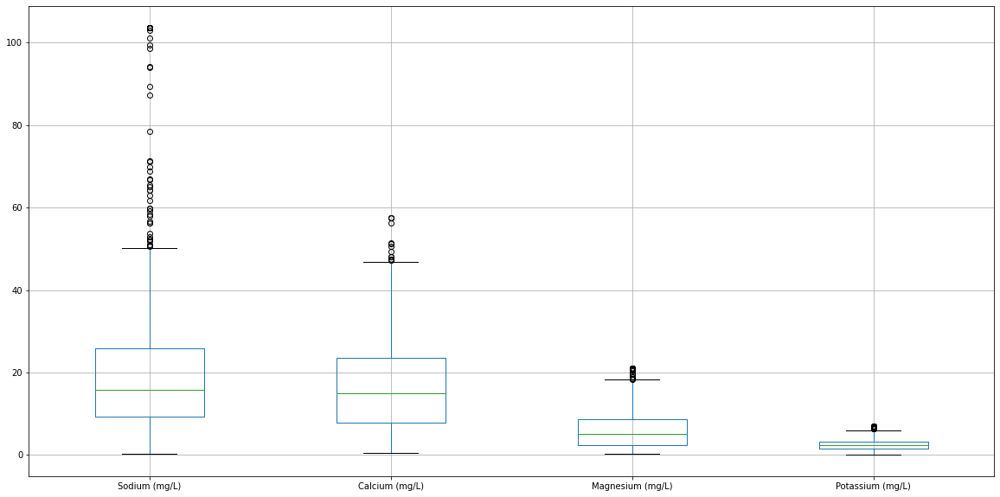

In [ ]:
water_quality.boxplot(column=['Sodium (mg/L)','Calcium (mg/L)', 'Magnesium (mg/L)','Potassium (mg/L)'],figsize=(20,10))

<AxesSubplot:>

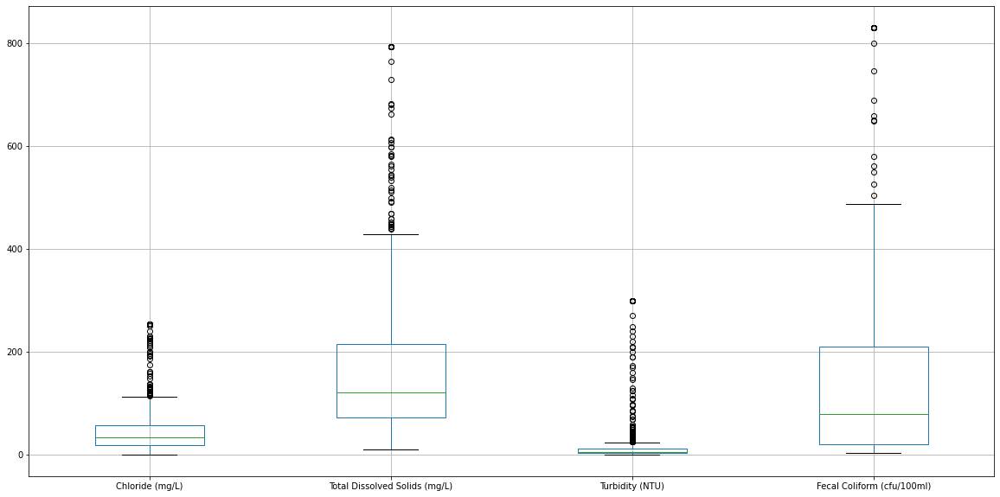

In [ ]:
water_quality.boxplot(column=['Chloride (mg/L)','Total Dissolved Solids (mg/L)',
                              'Turbidity (NTU)','Fecal Coliform (cfu/100ml)'],figsize=(20,10))

<AxesSubplot:>

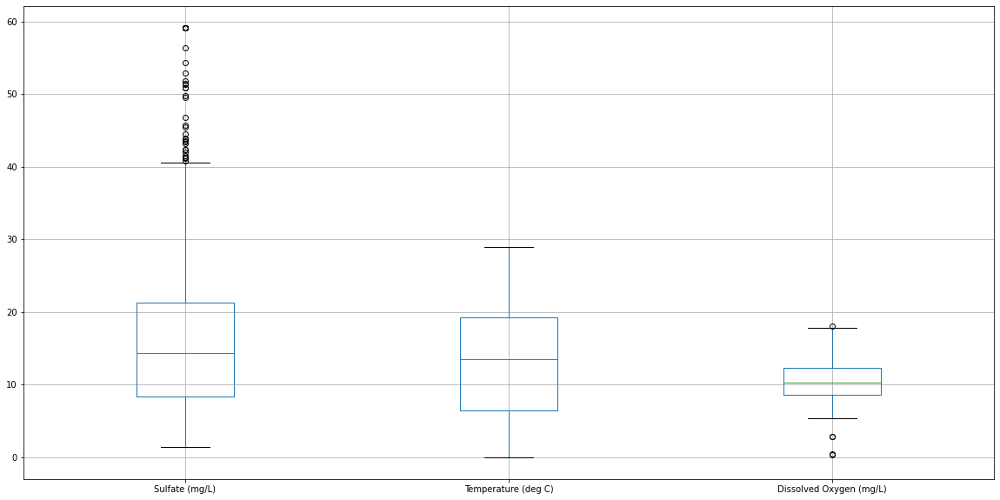

In [ ]:
water_quality.boxplot(column=['Sulfate (mg/L)','Temperature (deg C)', 'Dissolved Oxygen (mg/L)'],figsize=(20,10))

<AxesSubplot:>

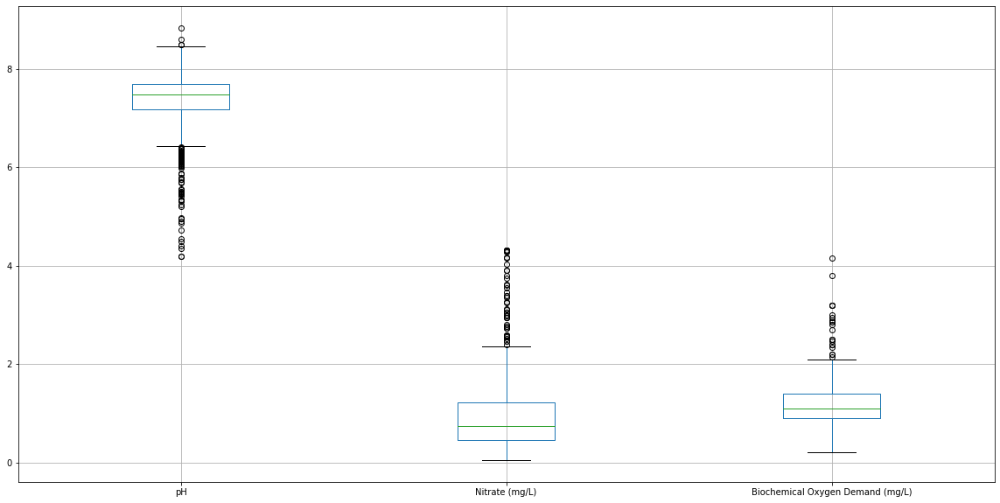

In [ ]:
water_quality.boxplot(column=['pH', 'Nitrate (mg/L)','Biochemical Oxygen Demand (mg/L)'],figsize=(20,10))

##### Handling Missing Values
- Each column will be handled differently

In [ ]:
## Temperature and pH
water_quality['Temperature (deg C)'].interpolate(method='time', inplace=True)
water_quality['pH'].interpolate(method='time', inplace=True)
water_quality['Dissolved Oxygen (mg/L)'].interpolate(method='time', inplace=True)

water_quality

C:\Users\sweth\anaconda3\lib\site-packages\pandas\core\generic.py:6915: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)


CharacteristicName,Sulfate (mg/L),Chloride (mg/L),Sodium (mg/L),Potassium (mg/L),Calcium (mg/L),Magnesium (mg/L),Total Dissolved Solids (mg/L),Turbidity (NTU),Temperature (deg C),pH,Dissolved Oxygen (mg/L),Nitrate (mg/L),Biochemical Oxygen Demand (mg/L),Fecal Coliform (cfu/100ml)
ActivityStartDate,,,,,,,,,,,,,,
2015-01-01,2.800000,0.516000,0.303000,0.148000,1.710000,0.391000,NaN,NaN,0.100000,6.190000,NaN,NaN,NaN,NaN
2015-01-02,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.216964,6.543816,NaN,NaN,NaN,NaN
2015-01-03,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.333929,6.897632,NaN,NaN,NaN,NaN
2015-01-04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.450893,7.251447,NaN,NaN,NaN,NaN
2015-01-05,18.771429,35.821429,17.207143,4.189286,18.245714,7.371429,NaN,11.142857,4.567857,7.605263,13.637826,0.7200,1.2,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2019-12-27,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.300000,7.662500,14.256250,NaN,NaN,NaN
2019-12-28,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.300000,7.525000,13.912500,NaN,NaN,NaN
2019-12-29,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.300000,7.387500,13.568750,NaN,NaN,NaN


In [ ]:
## all other features
for column in water_quality.columns:
    water_quality[column].fillna(water_quality[column].median(), inplace = True)

water_quality

C:\Users\sweth\anaconda3\lib\site-packages\pandas\core\generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)


CharacteristicName,Sulfate (mg/L),Chloride (mg/L),Sodium (mg/L),Potassium (mg/L),Calcium (mg/L),Magnesium (mg/L),Total Dissolved Solids (mg/L),Turbidity (NTU),Temperature (deg C),pH,Dissolved Oxygen (mg/L),Nitrate (mg/L),Biochemical Oxygen Demand (mg/L),Fecal Coliform (cfu/100ml)
ActivityStartDate,,,,,,,,,,,,,,
2015-01-01,2.800000,0.516000,0.303000,0.148000,1.710000,0.391000,121.463462,6.045000,0.100000,6.190000,10.346667,0.7400,1.1,80.0
2015-01-02,14.305000,33.637857,15.841111,2.328611,14.910186,5.062727,121.463462,6.045000,1.216964,6.543816,10.346667,0.7400,1.1,80.0
2015-01-03,14.305000,33.637857,15.841111,2.328611,14.910186,5.062727,121.463462,6.045000,2.333929,6.897632,10.346667,0.7400,1.1,80.0
2015-01-04,14.305000,33.637857,15.841111,2.328611,14.910186,5.062727,121.463462,6.045000,3.450893,7.251447,10.346667,0.7400,1.1,80.0
2015-01-05,18.771429,35.821429,17.207143,4.189286,18.245714,7.371429,121.463462,11.142857,4.567857,7.605263,13.637826,0.7200,1.2,80.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2019-12-27,14.305000,33.637857,15.841111,2.328611,14.910186,5.062727,121.463462,6.045000,2.300000,7.662500,14.256250,0.7400,1.1,80.0
2019-12-28,14.305000,33.637857,15.841111,2.328611,14.910186,5.062727,121.463462,6.045000,2.300000,7.525000,13.912500,0.7400,1.1,80.0
2019-12-29,14.305000,33.637857,15.841111,2.328611,14.910186,5.062727,121.463462,6.045000,2.300000,7.387500,13.568750,0.7400,1.1,80.0


#### Removing duplicate rows

In [ ]:
water_quality.drop_duplicates()

CharacteristicName,Sulfate (mg/L),Chloride (mg/L),Sodium (mg/L),Potassium (mg/L),Calcium (mg/L),Magnesium (mg/L),Total Dissolved Solids (mg/L),Turbidity (NTU),Temperature (deg C),pH,Dissolved Oxygen (mg/L),Nitrate (mg/L),Biochemical Oxygen Demand (mg/L),Fecal Coliform (cfu/100ml)
ActivityStartDate,,,,,,,,,,,,,,
2015-01-01,2.800000,0.516000,0.303000,0.148000,1.710000,0.391000,121.463462,6.045000,0.100000,6.190000,10.346667,0.7400,1.1,80.0
2015-01-02,14.305000,33.637857,15.841111,2.328611,14.910186,5.062727,121.463462,6.045000,1.216964,6.543816,10.346667,0.7400,1.1,80.0
2015-01-03,14.305000,33.637857,15.841111,2.328611,14.910186,5.062727,121.463462,6.045000,2.333929,6.897632,10.346667,0.7400,1.1,80.0
2015-01-04,14.305000,33.637857,15.841111,2.328611,14.910186,5.062727,121.463462,6.045000,3.450893,7.251447,10.346667,0.7400,1.1,80.0
2015-01-05,18.771429,35.821429,17.207143,4.189286,18.245714,7.371429,121.463462,11.142857,4.567857,7.605263,13.637826,0.7200,1.2,80.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2019-12-27,14.305000,33.637857,15.841111,2.328611,14.910186,5.062727,121.463462,6.045000,2.300000,7.662500,14.256250,0.7400,1.1,80.0
2019-12-28,14.305000,33.637857,15.841111,2.328611,14.910186,5.062727,121.463462,6.045000,2.300000,7.525000,13.912500,0.7400,1.1,80.0
2019-12-29,14.305000,33.637857,15.841111,2.328611,14.910186,5.062727,121.463462,6.045000,2.300000,7.387500,13.568750,0.7400,1.1,80.0


### Data smoothing

In [ ]:
water_quality_smooth = water_quality.copy(deep=True)
water_quality_smooth= water_quality_smooth.rolling(window=20, min_periods=1).mean()
water_quality_smooth

CharacteristicName,Sulfate (mg/L),Chloride (mg/L),Sodium (mg/L),Potassium (mg/L),Calcium (mg/L),Magnesium (mg/L),Total Dissolved Solids (mg/L),Turbidity (NTU),Temperature (deg C),pH,Dissolved Oxygen (mg/L),Nitrate (mg/L),Biochemical Oxygen Demand (mg/L),Fecal Coliform (cfu/100ml)
ActivityStartDate,,,,,,,,,,,,,,
2015-01-01,2.800000,0.516000,0.303000,0.148000,1.710000,0.391000,121.463462,6.045000,0.100000,6.190000,10.346667,0.740000,1.100000,80.0
2015-01-02,8.552500,17.076929,8.072056,1.238306,8.310093,2.726863,121.463462,6.045000,0.658482,6.366908,10.346667,0.740000,1.100000,80.0
2015-01-03,10.470000,22.597238,10.661741,1.601741,10.510124,3.505485,121.463462,6.045000,1.216964,6.543816,10.346667,0.740000,1.100000,80.0
2015-01-04,11.428750,25.357393,11.956583,1.783458,11.610140,3.894795,121.463462,6.045000,1.775446,6.720724,10.346667,0.740000,1.100000,80.0
2015-01-05,12.897286,27.450200,13.006695,2.264624,12.937255,4.590122,121.463462,7.064571,2.333929,6.897632,11.004899,0.736000,1.120000,80.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2019-12-27,14.305000,33.637857,15.841111,2.328611,14.910186,5.062727,121.463462,6.045000,2.845635,7.452986,13.396548,0.925987,1.093833,80.0
2019-12-28,14.305000,33.637857,15.841111,2.328611,14.910186,5.062727,121.463462,6.045000,2.746429,7.436736,13.429950,0.925987,1.093833,80.0
2019-12-29,14.305000,33.637857,15.841111,2.328611,14.910186,5.062727,121.463462,6.045000,2.657143,7.424861,13.455054,0.862759,1.106333,80.0


#### Plotting time-series graph of all parameters (processed data)

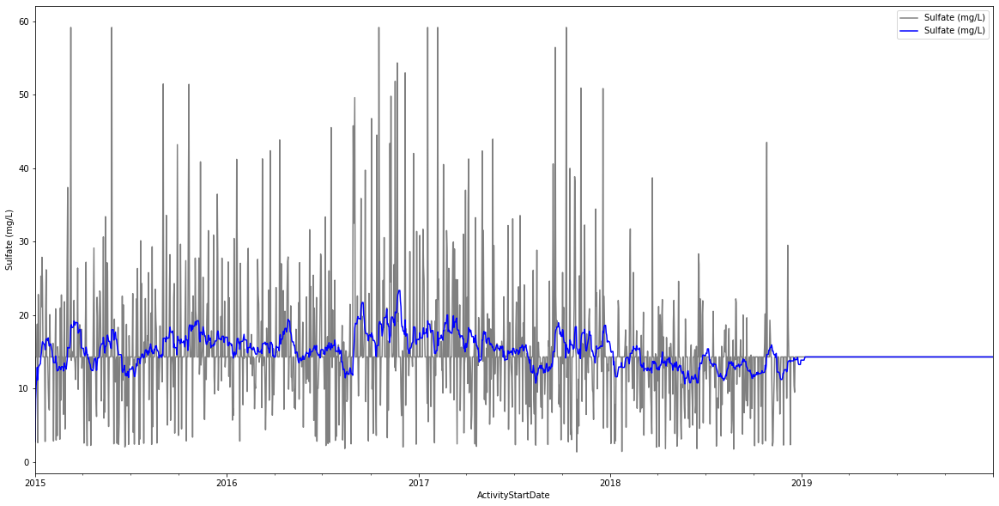

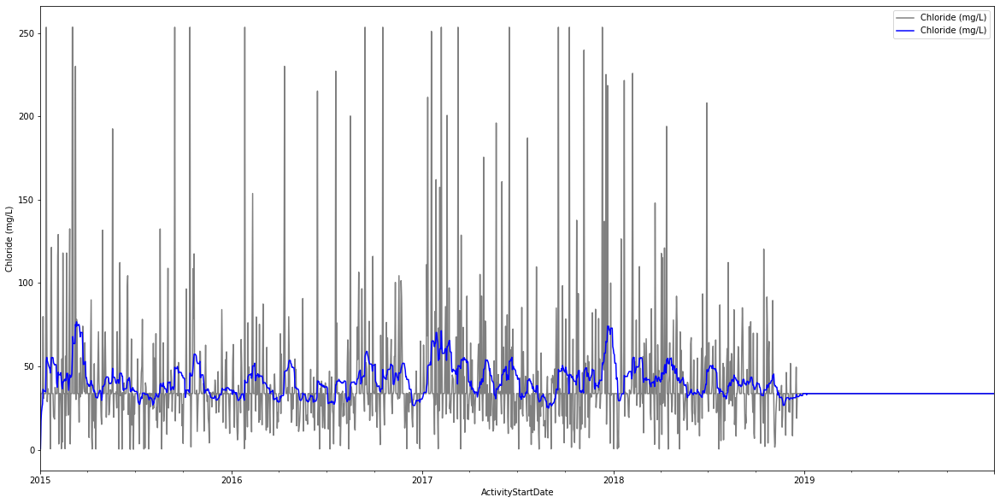

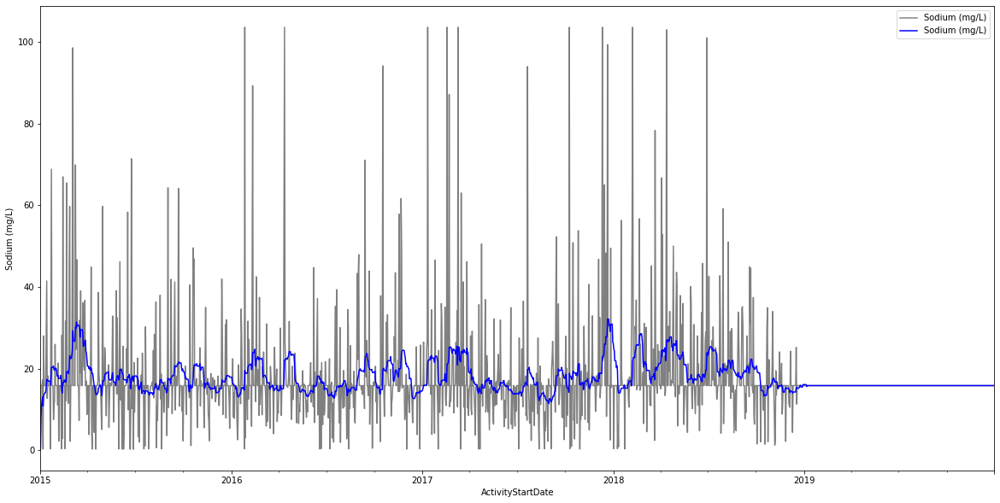

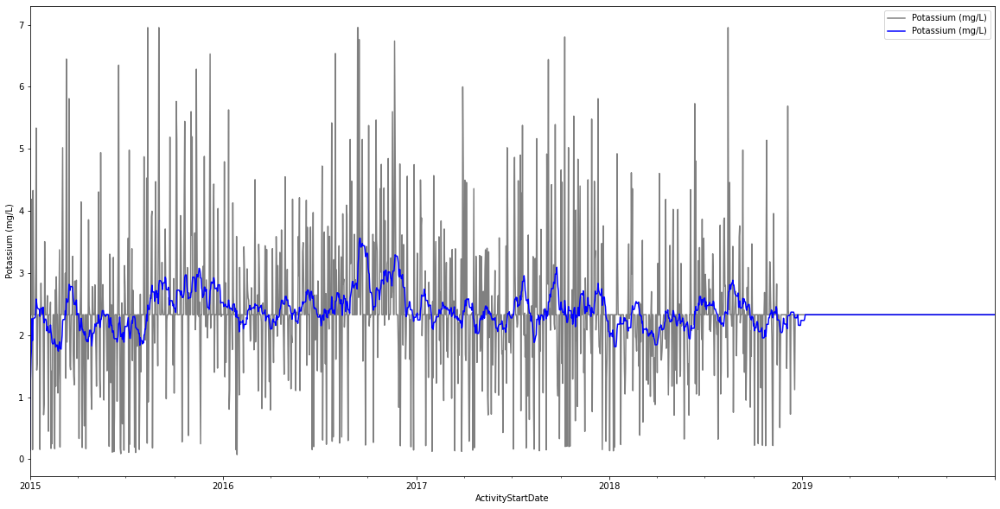

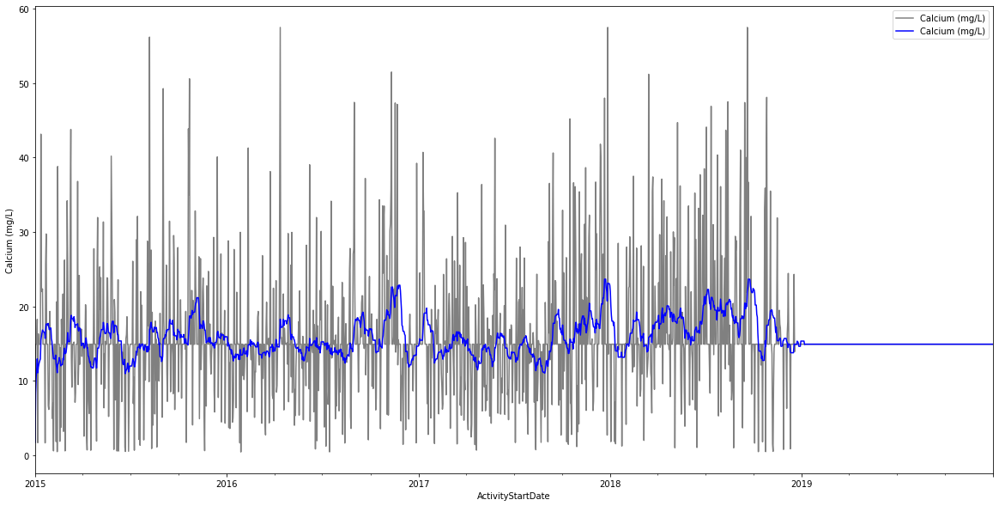

...

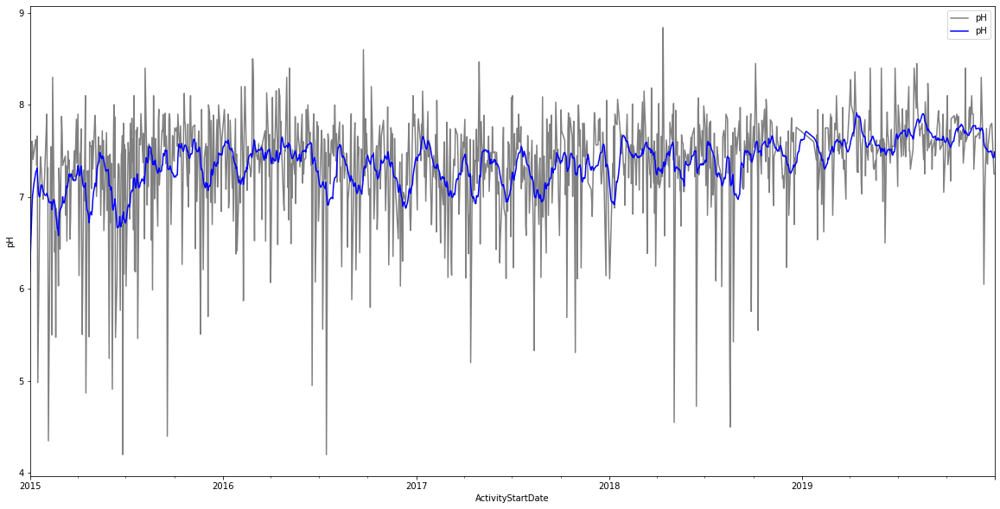

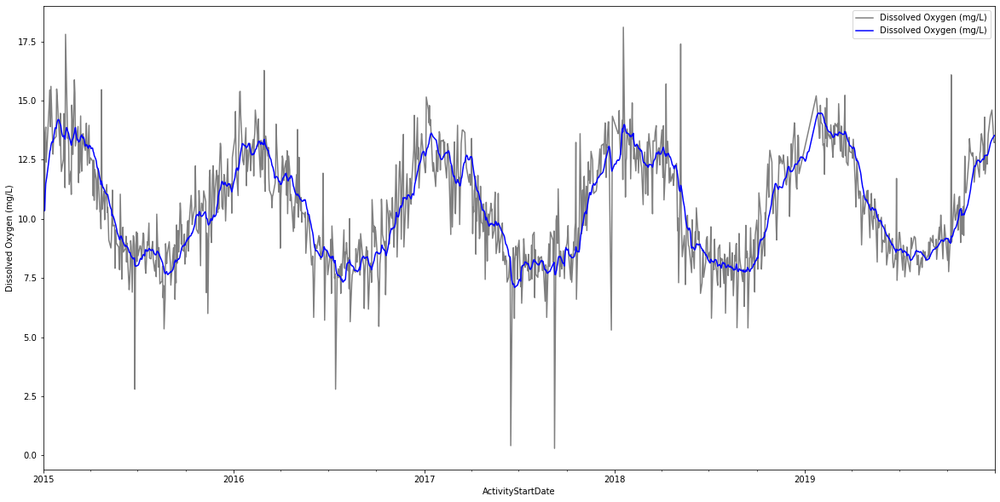

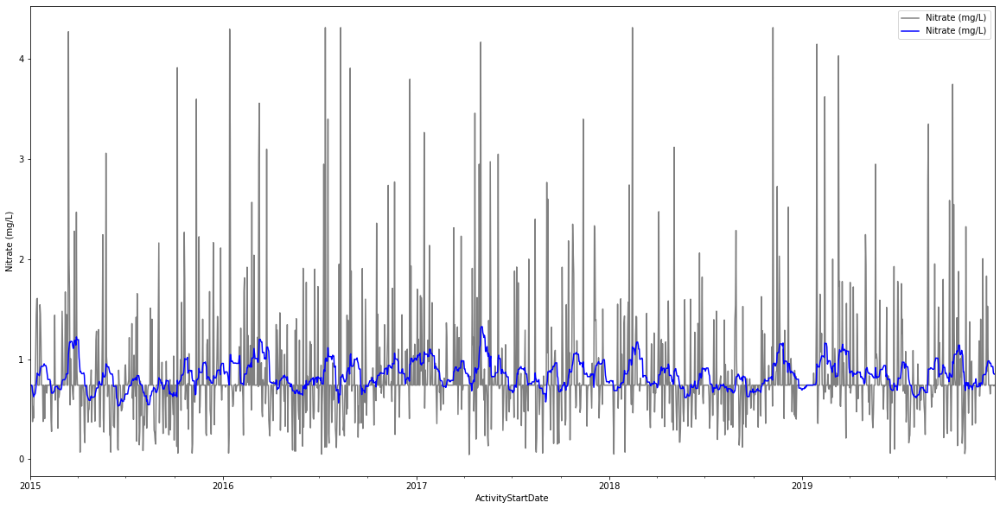

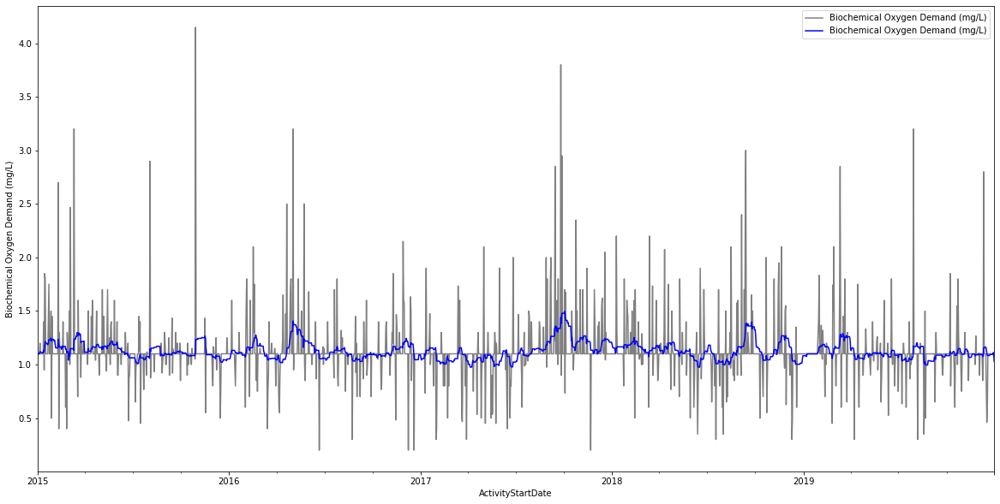

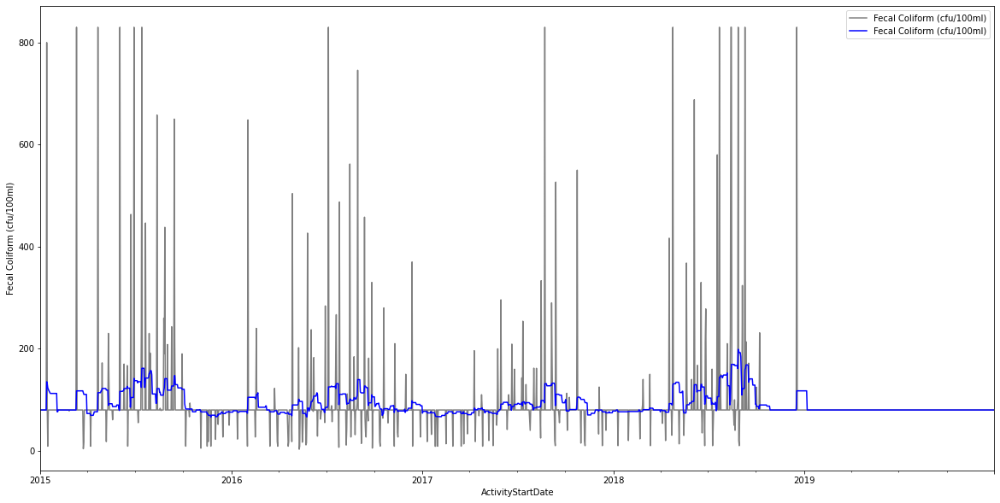

In [ ]:
for column in list(water_quality_smooth.columns):
    fig, ax = plt.subplots(figsize=(20,10))
    water_quality.plot(y=column,ax=ax, color='grey')
    water_quality_smooth.plot(y=column,ax=ax, color='blue')
    plt.ylabel(column)

## Exploratory Data Analysis

#### Heat Map

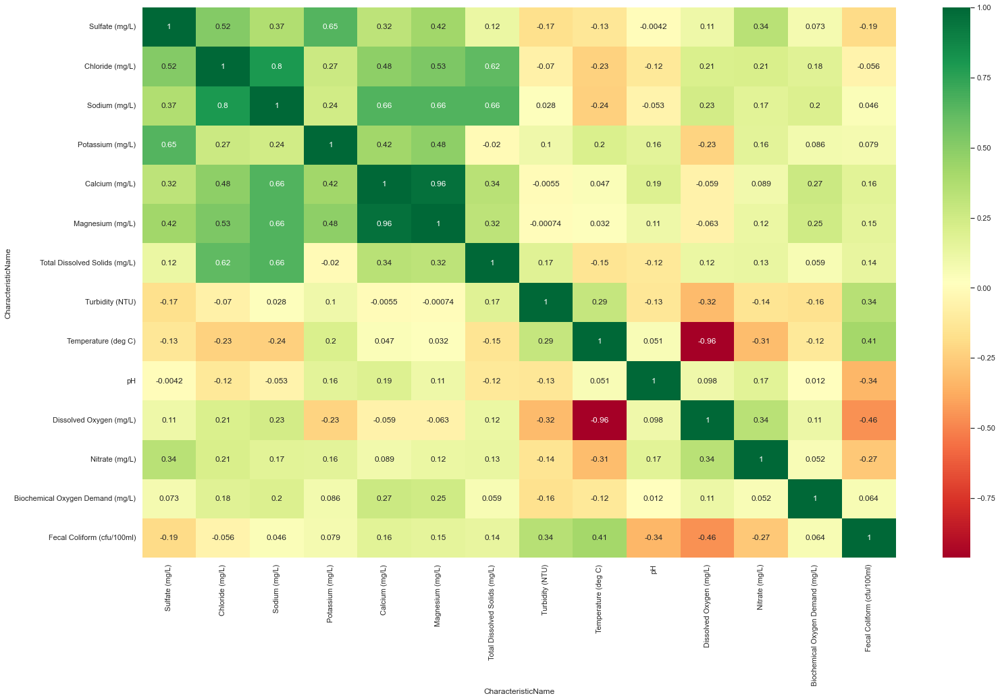

In [ ]:
## correlation between parameters

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(25,15))
sns.set(style="whitegrid")
sns.heatmap(water_quality_smooth.corr(method='pearson'),annot=True, cmap='RdYlGn')
plt.show()

### WQI calculation

In [ ]:
# ideal_value = {'pH': (8,0) , 'Electric_conductivity': (1500,0), 'TDS':(600,0), 'Calcium' : 75000, 'Magnesium' :50000, 'Potassium' : 12000, \
#               'Sodium' : 200000, 'Chloride' : 200, 'Bromide': 500, 'Nitrate' : 10, 'Sulphate' : 250, 'Flouride' : 1.5}

# Sulphate - 250 mg/L
# Chloride - 250 mg/L
# Sodium - 200 mg/L
# Potassium - 10 mg/L
# Calcium - 100 mg/L
# Magnesium - 50 mg/L
# TDS - 500 mg/L
# DO - 7 mg/L
# pH - 8.5
# Turbidity - 5 NTU
# Temp - 25
# Fecal Coliform - 100
# Nitrate - 45 mg/L
# BOD - 5

import numpy as np

ideal_value = {'Sulfate':(250,0), 'Chloride':(250,0) , 'Sodium':(200,0), 'Potassium':(10,0),
               'Calcium':(100,0),'Magnesium':(50,0),'TDS':(500,0),'Turbidity':(5,0),'Temperature':(25,0),
               'pH': (8.5,7.0), 'Dissolved Oxygen':(7,14.6), 'Nitrate' : (45,0), 'Biochemical Oxygen Demand' : (5,0),
               'Fecal Coliform' : (100,0)}

value_list = list(ideal_value.values())

# print(value_list)
S = 0
for value in value_list:
    S += value[0]

K = 1/S

W = [K/x[0] for x in value_list]
W_sum = sum(W)
# print(W_sum)

## Finding qi for WQI calculation
def findQi(rowInput):
    Q = []
    if(len(rowInput)!= len(value_list)):
        print("Error")
        return None
    for i in range(0, len(value_list)):
        Vi = rowInput[i]
        Videal = value_list[i][1]
        Si = value_list[i][0]
        Qi = 100 * ((Vi - Videal)/ (Si - Videal))
        Q.append(Qi)
    return Q



WQ_data = np.array(water_quality_smooth)

dataset_wqi = []

for i in range(len(WQ_data)):
    test_row = WQ_data[i][:]
    Q = findQi(test_row)
    WQI = 0
    for i in range(len(value_list)):
        WQI = WQI + Q[i] * W [i]
    WQI = WQI / W_sum
    test_row_list = test_row.tolist()
    test_row_list.append(WQI)
    dataset_wqi.append(test_row_list)

wq_WQI = np.array(dataset_wqi)

water_quality_WQI = pd.DataFrame(wq_WQI, columns =['Sulfate (mg/L)', 'Chloride (mg/L)', 'Sodium (mg/L)','Potassium (mg/L)',
                                                   'Calcium (mg/L)', 'Magnesium (mg/L)','Total Dissolved Solids (mg/L)',
                                                   'Turbidity (NTU)','Temperature (deg C)', 'pH', 'Dissolved Oxygen (mg/L)',
                                                   'Nitrate (mg/L)', 'Biochemical Oxygen Demand (mg/L)',
                                                   'Fecal Coliform (cfu/100ml)','WQI'])
water_quality_WQI

,Sulfate (mg/L),Chloride (mg/L),Sodium (mg/L),Potassium (mg/L),Calcium (mg/L),Magnesium (mg/L),Total Dissolved Solids (mg/L),Turbidity (NTU),Temperature (deg C),pH,Dissolved Oxygen (mg/L),Nitrate (mg/L),Biochemical Oxygen Demand (mg/L),Fecal Coliform (cfu/100ml),WQI
0,2.800000,0.516000,0.303000,0.148000,1.710000,0.391000,121.463462,6.045000,0.100000,6.190000,10.346667,0.740000,1.100000,80.0,35.671682
1,8.552500,17.076929,8.072056,1.238306,8.310093,2.726863,121.463462,6.045000,0.658482,6.366908,10.346667,0.740000,1.100000,80.0,38.840933
2,10.470000,22.597238,10.661741,1.601741,10.510124,3.505485,121.463462,6.045000,1.216964,6.543816,10.346667,0.740000,1.100000,80.0,41.019089
3,11.428750,25.357393,11.956583,1.783458,11.610140,3.894795,121.463462,6.045000,1.775446,6.720724,10.346667,0.740000,1.100000,80.0,42.949471
4,12.897286,27.450200,13.006695,2.264624,12.937255,4.590122,121.463462,7.064571,2.333929,6.897632,11.004899,0.736000,1.120000,80.0,48.564266
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1821,14.305000,33.637857,15.841111,2.328611,14.910186,5.062727,121.463462,6.045000,2.845635,7.452986,13.396548,0.925987,1.093833,80.0,43.882059
1822,14.305000,33.637857,15.841111,2.328611,14.910186,5.062727,121.463462,6.045000,2.746429,7.436736,13.429950,0.925987,1.093833,80.0,43.647235
1823,14.305000,33.637857,15.841111,2.328611,14.910186,5.062727,121.463462,6.045000,2.657143,7.424861,13.455054,0.862759,1.106333,80.0,43.524493
1824,14.305000,33.637857,15.841111,2.328611,14.910186,5.062727,121.463462,6.045000,2.577778,7.427986,13.513804,0.851572,1.113000,80.0,43.441886


In [ ]:
water_quality_WQI.describe()

,Sulfate (mg/L),Chloride (mg/L),Sodium (mg/L),Potassium (mg/L),Calcium (mg/L),Magnesium (mg/L),Total Dissolved Solids (mg/L),Turbidity (NTU),Temperature (deg C),pH,Dissolved Oxygen (mg/L),Nitrate (mg/L),Biochemical Oxygen Demand (mg/L),Fecal Coliform (cfu/100ml),WQI
count,1826.000000,1826.000000,1826.000000,1826.000000,1826.000000,1826.000000,1826.000000,1826.000000,1826.000000,1826.000000,1826.000000,1826.000000,1826.000000,1826.000000,1826.000000
mean,15.036109,39.647822,17.769387,2.385524,15.703683,5.529029,143.031123,12.776272,12.362059,7.366103,10.522180,0.839138,1.127293,91.968234,82.078683
std,2.022367,8.865285,3.577437,0.268781,2.309079,0.933201,30.201026,10.171614,7.152289,0.237768,2.018109,0.133524,0.080524,21.670084,48.252106
min,2.800000,0.516000,0.303000,0.148000,1.710000,0.391000,91.522547,4.583185,0.100000,6.190000,7.107455,0.530602,0.975833,66.050000,30.284471
25%,13.956746,33.637857,15.749965,2.253668,14.429479,5.019526,121.463462,6.045000,5.351996,7.212387,8.586195,0.740000,1.075000,79.900000,48.654727
50%,14.568904,37.102542,16.371635,2.328611,14.910186,5.184600,131.970089,7.319821,12.603387,7.399876,10.359868,0.825503,1.112500,80.000000,60.342562
75%,16.266029,44.397567,19.550521,2.496885,16.980835,6.117522,160.043417,18.606729,19.016790,7.531961,12.457208,0.922983,1.166250,101.694643,105.946738
max,23.349088,76.703937,32.141327,3.560737,23.657572,9.041114,268.087416,55.728989,25.369654,7.913091,14.474621,1.324408,1.496250,198.893750,278.559911


In [ ]:
def WQS(value):
    if value>0 and value<=25:
        return 'Excellent'

    if value>25 and value<=50:
        return 'Good'

    if value>50 and value<=75:
        return 'Medium'

    if value>75 and value<=100:
        return 'Bad'

    if value>100 or value<0:
        return 'Unsuitable for drinking'


## Creating a column for WQS
water_quality_WQI['WQS'] = water_quality_WQI['WQI'].apply(WQS)

In [ ]:
water_quality_WQI

,Sulfate (mg/L),Chloride (mg/L),Sodium (mg/L),Potassium (mg/L),Calcium (mg/L),Magnesium (mg/L),Total Dissolved Solids (mg/L),Turbidity (NTU),Temperature (deg C),pH,Dissolved Oxygen (mg/L),Nitrate (mg/L),Biochemical Oxygen Demand (mg/L),Fecal Coliform (cfu/100ml),WQI,WQS
0,2.800000,0.516000,0.303000,0.148000,1.710000,0.391000,121.463462,6.045000,0.100000,6.190000,10.346667,0.740000,1.100000,80.0,35.671682,Good
1,8.552500,17.076929,8.072056,1.238306,8.310093,2.726863,121.463462,6.045000,0.658482,6.366908,10.346667,0.740000,1.100000,80.0,38.840933,Good
2,10.470000,22.597238,10.661741,1.601741,10.510124,3.505485,121.463462,6.045000,1.216964,6.543816,10.346667,0.740000,1.100000,80.0,41.019089,Good
3,11.428750,25.357393,11.956583,1.783458,11.610140,3.894795,121.463462,6.045000,1.775446,6.720724,10.346667,0.740000,1.100000,80.0,42.949471,Good
4,12.897286,27.450200,13.006695,2.264624,12.937255,4.590122,121.463462,7.064571,2.333929,6.897632,11.004899,0.736000,1.120000,80.0,48.564266,Good
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1821,14.305000,33.637857,15.841111,2.328611,14.910186,5.062727,121.463462,6.045000,2.845635,7.452986,13.396548,0.925987,1.093833,80.0,43.882059,Good
1822,14.305000,33.637857,15.841111,2.328611,14.910186,5.062727,121.463462,6.045000,2.746429,7.436736,13.429950,0.925987,1.093833,80.0,43.647235,Good
1823,14.305000,33.637857,15.841111,2.328611,14.910186,5.062727,121.463462,6.045000,2.657143,7.424861,13.455054,0.862759,1.106333,80.0,43.524493,Good
1824,14.305000,33.637857,15.841111,2.328611,14.910186,5.062727,121.463462,6.045000,2.577778,7.427986,13.513804,0.851572,1.113000,80.0,43.441886,Good


In [ ]:
water_quality_WQI.to_excel('Complete_Data_WQI.xlsx')

#### Plotting time-series graph of WQI

Text(0, 0.5, 'WQI')

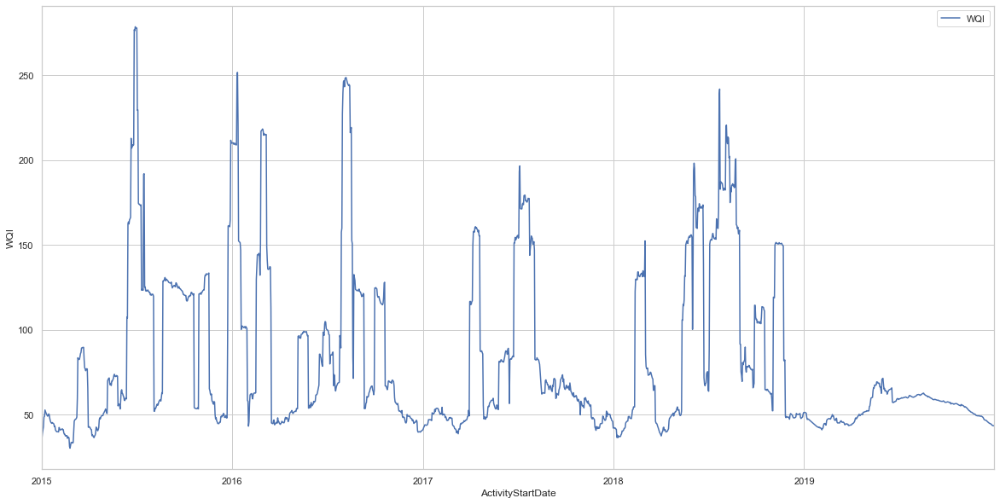

In [ ]:
wqi = list(water_quality_WQI['WQI'])
water_quality_smooth['WQI'] = wqi

fig, ax = plt.subplots(figsize=(20,10))
water_quality_smooth.plot(y='WQI', ax=ax)
plt.ylabel('WQI')

In [ ]:
water_quality_WQI.index

RangeIndex(start=0, stop=1826, step=1)

In [ ]:
water_quality_WQI.isnull().sum()

Sulfate (mg/L)                      0
Chloride (mg/L)                     0
Sodium (mg/L)                       0
Potassium (mg/L)                    0
Calcium (mg/L)                      0
Magnesium (mg/L)                    0
Total Dissolved Solids (mg/L)       0
Turbidity (NTU)                     0
Temperature (deg C)                 0
pH                                  0
Dissolved Oxygen (mg/L)             0
Nitrate (mg/L)                      0
Biochemical Oxygen Demand (mg/L)    0
Fecal Coliform (cfu/100ml)          0
WQI                                 0
WQS                                 0
dtype: int64

#### Pair Plot

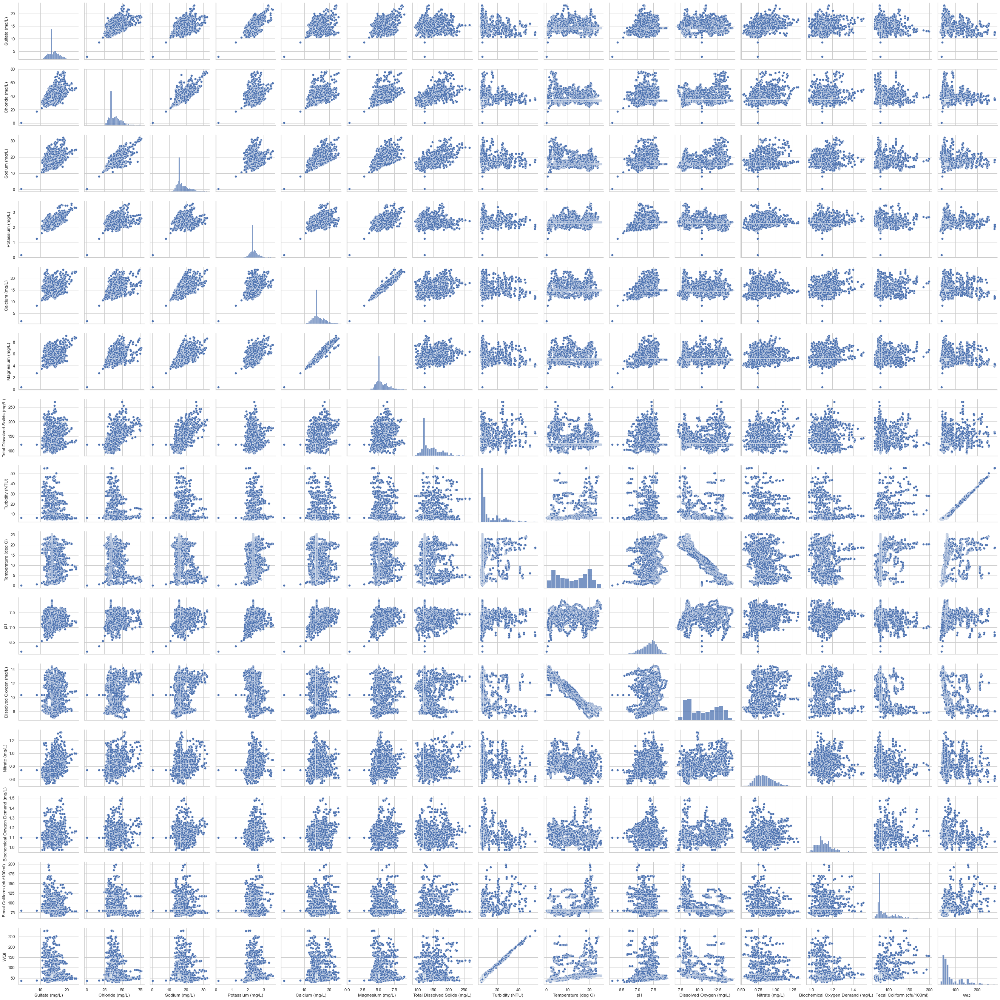

In [ ]:
sns.pairplot(water_quality_smooth)

### Data Normalization

In [ ]:
## For normalised input into model - k fold
from sklearn.preprocessing import MinMaxScaler

all_std = MinMaxScaler().fit_transform(water_quality_WQI.loc[:,water_quality_WQI.columns!='WQS'])
std_x = all_std[:,:-1]
std_y = all_std[:,-1]

###### Lasso Regularization (L1)

In [ ]:
# from sklearn.linear_model import Lasso

# ## model training
# lasso_model = Lasso(alpha=0.5)

In [ ]:
# ## model evaluation
# from sklearn.model_selection import cross_validate

# lasso_score = cross_validate(lasso_model, data_x, data_y, scoring=['neg_mean_squared_error','r2'],
#                              cv=k_fold_splits, n_jobs=-1)

# mse_lasso = np.mean(lasso_score['test_neg_mean_squared_error'])
# r2_lasso = np.mean(lasso_score['test_r2'])

# print(f'Mean Squared Error for Lasso Regularization with K-Fold validation is {-mse_lasso:.4f}')
# # print(f'R2 score for Lasso Regularization with K-Fold validation is {r2_lasso:.4f}')

#### The k fold is giving better results than train-test , hence we will be using the same for our models

###  Correlation analysis
- Finding most correlating features with WQI to use for model

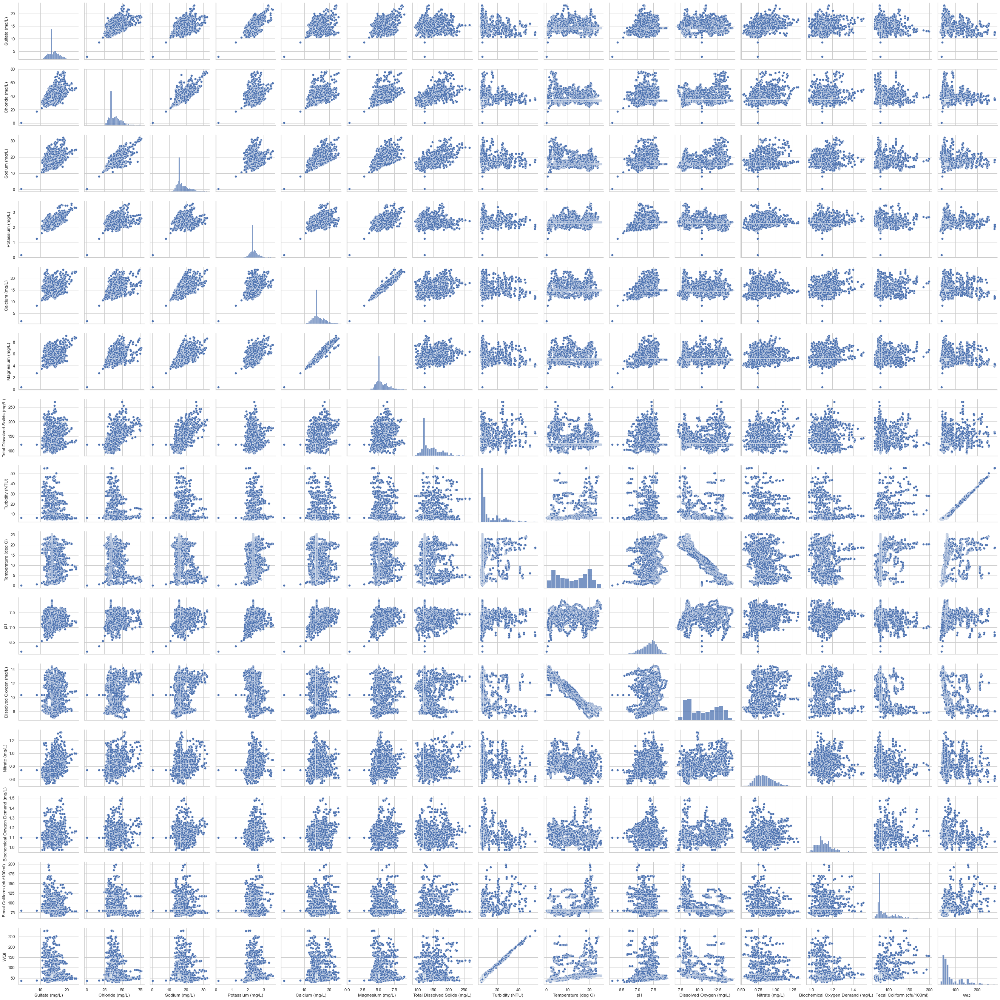

In [ ]:
sns.pairplot(water_quality_WQI)

Correlation of WQI with Sulfate (mg/L): -0.1744
Correlation of WQI with Chloride (mg/L): -0.0931
Correlation of WQI with Sodium (mg/L): 0.0022
Correlation of WQI with Potassium (mg/L): 0.1389
Correlation of WQI with Calcium (mg/L): 0.0170
Correlation of WQI with Magnesium (mg/L): 0.0182
Correlation of WQI with Total Dissolved Solids (mg/L): 0.1473
Correlation of WQI with Turbidity (NTU): 0.9928
Correlation of WQI with Temperature (deg C): 0.3995
Correlation of WQI with pH: -0.0911
Correlation of WQI with Dissolved Oxygen (mg/L): -0.4230
Correlation of WQI with Nitrate (mg/L): -0.1699
Correlation of WQI with Biochemical Oxygen Demand (mg/L): -0.1562
Correlation of WQI with Fecal Coliform (cfu/100ml): 0.3750


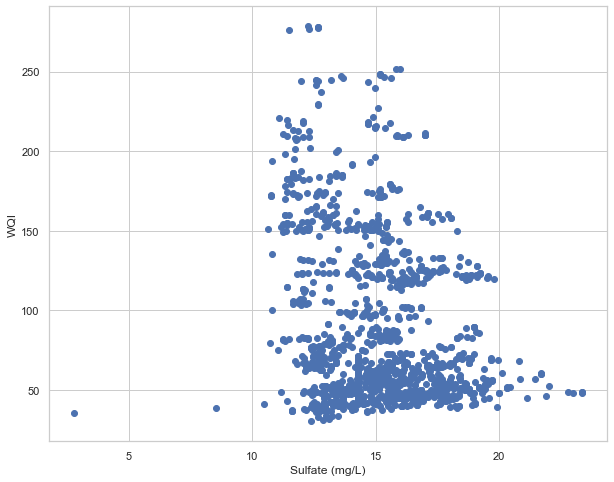

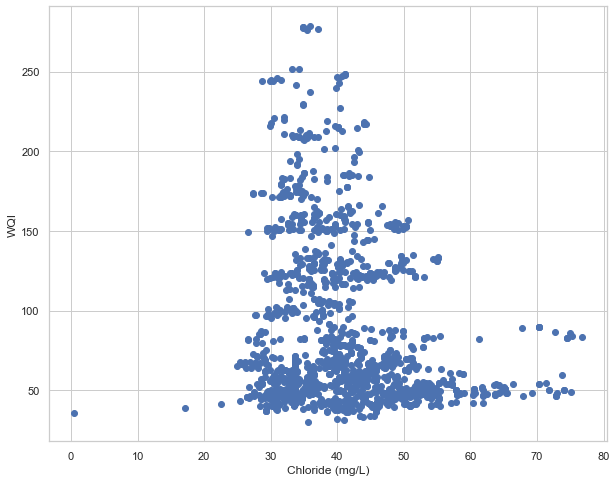

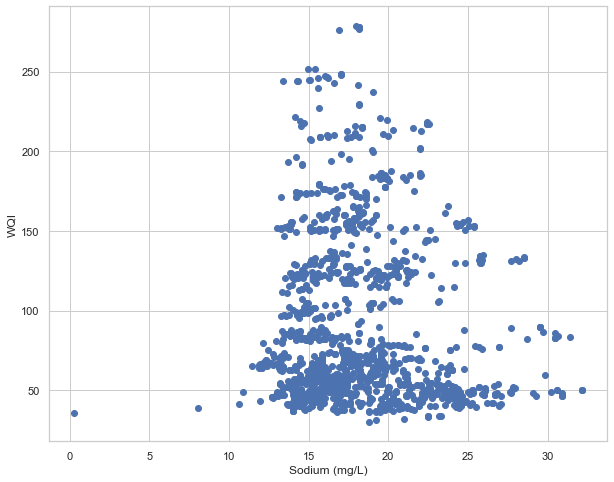

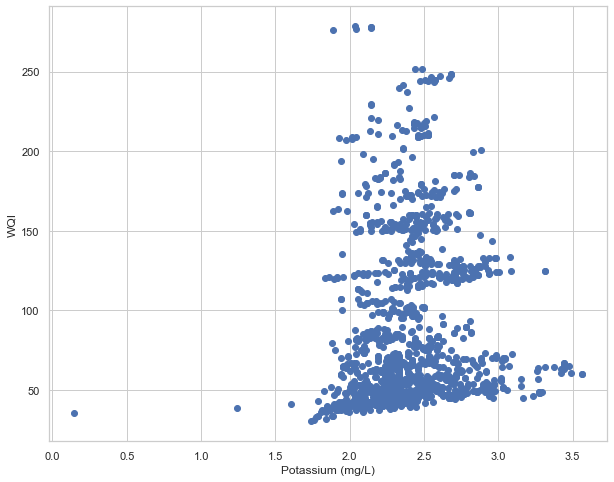

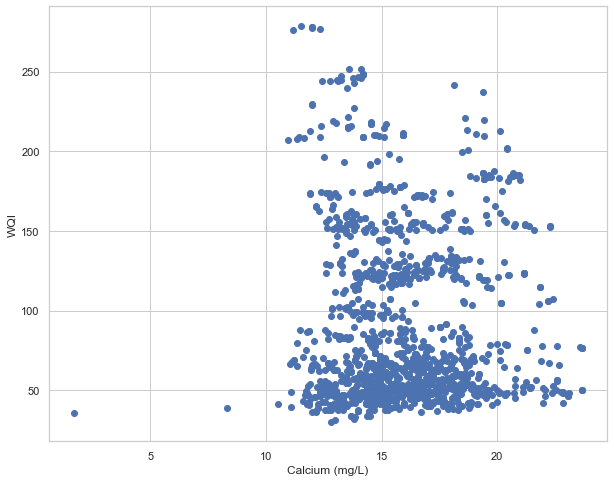

...

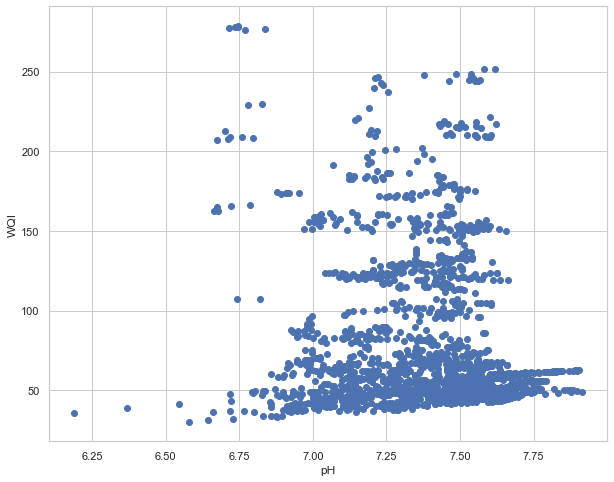

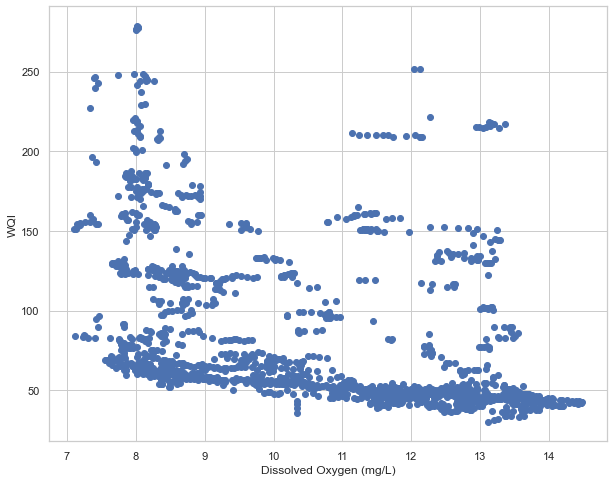

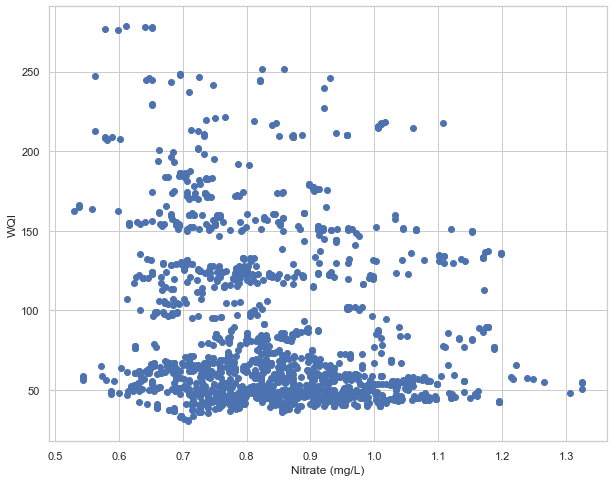

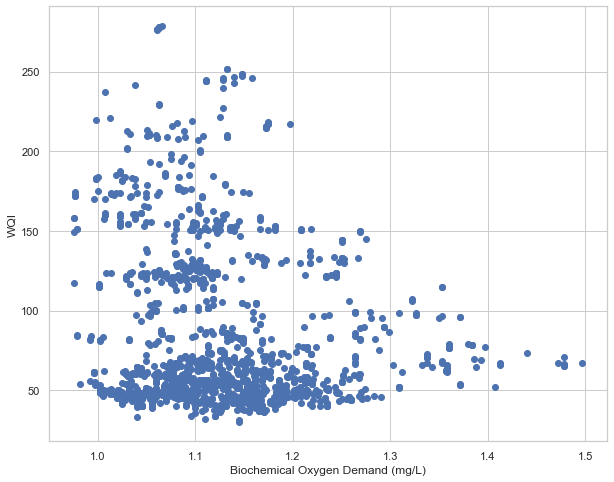

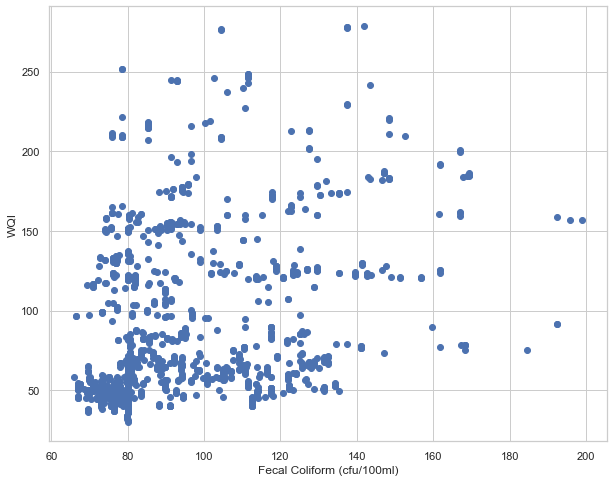

In [ ]:
for column in list(water_quality_WQI.columns)[:-2]:
    plt.figure(figsize=(10,8))
    plt.scatter(water_quality_WQI[column], water_quality_WQI['WQI'])
    plt.xlabel(column)
    plt.ylabel('WQI')
    print(f'Correlation of WQI with {column}: {(water_quality_WQI[column].corr(water_quality_WQI.WQI)):.4f}')

#### Only very few features correlate well with WQI, hence we will be taking only those-
- Turbidity, DO, Temp, BOD, TDS, Potassium, Fecal coliform, pH

### PCA

In [ ]:
## Splitting data unto train and test
from sklearn.model_selection import train_test_split

data_x = water_quality_WQI.drop(columns=['WQI','WQS'])
data_y_wqs = water_quality_WQI['WQS']

x_train, x_test, y_train, y_test = train_test_split(data_x,data_y_wqs,test_size = 0.2)

from sklearn.preprocessing import MinMaxScaler

# Normalize the features for PCA
minmax = MinMaxScaler()
x_train_norm = minmax.fit_transform(x_train)
x_test_norm = minmax.transform(x_test)

## PCA
from sklearn.decomposition import PCA

pca = PCA(n_components=10)
x_train_pca = pca.fit_transform(x_train_norm)
x_test_pca = pca.transform(x_test_norm)

In [ ]:
x_train

,Sulfate (mg/L),Chloride (mg/L),Sodium (mg/L),Potassium (mg/L),Calcium (mg/L),Magnesium (mg/L),Total Dissolved Solids (mg/L),Turbidity (NTU),Temperature (deg C),pH,Dissolved Oxygen (mg/L),Nitrate (mg/L),Biochemical Oxygen Demand (mg/L),Fecal Coliform (cfu/100ml)
822,15.602875,38.161898,18.824403,2.376718,15.031671,5.229075,137.708428,21.262714,5.718364,7.439957,12.622879,0.903396,1.000833,70.783333
1477,14.305000,33.637857,15.841111,2.328611,14.910186,5.062727,121.463462,6.045000,2.397561,7.673810,13.656263,0.740000,1.100000,80.000000
82,17.550654,51.088765,25.465039,2.598373,16.815914,6.397745,185.449378,13.533500,3.380870,7.182401,13.093717,1.107875,1.204833,113.700000
199,13.896811,33.979938,14.276888,2.259926,14.954733,5.352868,136.676016,21.066895,18.779288,7.137034,8.622653,0.808449,1.062429,124.250000
666,19.664419,48.144796,21.916621,2.885432,18.131504,7.310947,158.818395,9.313012,13.707315,7.376065,9.427525,0.857708,1.106667,81.283333
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
166,12.375950,40.516004,16.806081,1.923794,12.835065,4.196089,135.723192,30.992020,17.442964,6.672931,8.567926,0.557436,1.093000,126.355882
893,15.086057,44.983187,15.860634,2.231478,16.026535,6.172614,151.411961,13.570256,17.500595,7.128782,8.492951,0.895011,1.105000,94.883333
1314,11.415745,33.846655,20.002515,2.282083,19.424072,6.609346,210.790930,39.521573,20.257163,7.210784,8.054257,0.733044,1.050000,152.500000
233,15.234537,37.909702,16.561017,2.695174,16.466312,6.035091,124.323784,21.245281,20.486535,7.350089,7.740415,0.681583,1.170417,109.016667


In [ ]:
x_test

,Sulfate (mg/L),Chloride (mg/L),Sodium (mg/L),Potassium (mg/L),Calcium (mg/L),Magnesium (mg/L),Total Dissolved Solids (mg/L),Turbidity (NTU),Temperature (deg C),pH,Dissolved Oxygen (mg/L),Nitrate (mg/L),Biochemical Oxygen Demand (mg/L),Fecal Coliform (cfu/100ml)
947,12.252344,34.982439,16.050106,2.353392,13.532679,4.905704,140.019329,11.618924,21.147652,7.227081,8.112634,0.756547,1.145952,84.100000
1040,16.435886,45.450329,15.983707,2.472598,17.047572,6.164299,126.647319,7.596688,12.540786,7.346613,10.264141,0.974788,1.251667,100.750000
532,15.822563,40.766784,18.173116,2.703187,15.365044,5.607546,129.974041,11.730895,20.182854,7.585149,8.393459,0.800915,1.132333,93.883030
1092,16.399526,72.897767,30.885862,2.228957,23.058201,8.356998,201.074365,6.055961,3.397276,7.353174,12.074472,0.774006,1.208143,74.500000
505,14.140232,33.205691,14.602762,2.225279,14.191885,4.982917,116.305122,16.250909,13.910123,7.426367,10.550125,0.690450,1.264167,73.208611
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
693,23.349088,51.818341,24.490495,3.272304,22.843239,8.690330,135.392761,5.776792,9.005838,7.207521,10.885917,1.000744,1.164167,78.100000
1083,17.568192,64.474609,27.660588,2.480234,21.123324,7.616028,181.770008,6.477939,4.625935,7.504097,12.840017,0.961523,1.226143,74.400000
1599,14.305000,33.637857,15.841111,2.328611,14.910186,5.062727,121.463462,9.007917,14.331356,7.583540,10.217652,0.814832,1.109583,80.000000
1269,13.468484,35.144873,18.583021,2.622305,17.945510,6.171476,135.203716,9.316302,18.590609,7.357455,8.583089,0.854964,1.049333,125.027778


## Model - sample

### Decicion Tree

In [ ]:
from sklearn.metrics import confusion_matrix
from sklearn import tree
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report

##### with PCA

In [ ]:
## using train_test_split
pca_dt = DecisionTreeClassifier(criterion = "entropy", random_state = 10)
pca_dt.fit(x_train_pca, y_train)
y_pred_pca = pca_dt.predict(x_test_pca)

cm_pca = confusion_matrix(y_test, y_pred_pca)
print(cm_pca)
print(f'\nClassification report : \n {classification_report(y_test, y_pred_pca)}')

[[ 33   4   3   2]
 [  1 104   9   1]
 [  5  14 165   0]
 [  4   1   2 109]]

Classification report : 
                          precision    recall  f1-score   support

                    Bad       0.77      0.79      0.78        42
                   Good       0.85      0.90      0.87       115
                 Medium       0.92      0.90      0.91       184
Unsuitable for drinking       0.97      0.94      0.96       116

               accuracy                           0.90       457
              macro avg       0.88      0.88      0.88       457
           weighted avg       0.90      0.90      0.90       457



##### only high correlation features

In [ ]:
# Turbidity, DO, Temp, BOD, TDS, Potassium, Fecal coliform, pH
WQI_corr_df = water_quality_WQI[['Temperature (deg C)','Dissolved Oxygen (mg/L)', 'Turbidity (NTU)',
                                 'Biochemical Oxygen Demand (mg/L)','Total Dissolved Solids (mg/L)',
                                 'Fecal Coliform (cfu/100ml)', 'pH', 'Sulfate (mg/L)', 'WQI', 'WQS']]
WQI_corr_df

,Temperature (deg C),Dissolved Oxygen (mg/L),Turbidity (NTU),Biochemical Oxygen Demand (mg/L),Total Dissolved Solids (mg/L),Fecal Coliform (cfu/100ml),pH,Sulfate (mg/L),WQI,WQS
0,0.100000,10.346667,6.045000,1.100000,121.463462,80.0,6.190000,2.800000,35.671682,Good
1,0.658482,10.346667,6.045000,1.100000,121.463462,80.0,6.366908,8.552500,38.840933,Good
2,1.216964,10.346667,6.045000,1.100000,121.463462,80.0,6.543816,10.470000,41.019089,Good
3,1.775446,10.346667,6.045000,1.100000,121.463462,80.0,6.720724,11.428750,42.949471,Good
4,2.333929,11.004899,7.064571,1.120000,121.463462,80.0,6.897632,12.897286,48.564266,Good
...,...,...,...,...,...,...,...,...,...,...
1821,2.845635,13.396548,6.045000,1.093833,121.463462,80.0,7.452986,14.305000,43.882059,Good
1822,2.746429,13.429950,6.045000,1.093833,121.463462,80.0,7.436736,14.305000,43.647235,Good
1823,2.657143,13.455054,6.045000,1.106333,121.463462,80.0,7.424861,14.305000,43.524493,Good
1824,2.577778,13.513804,6.045000,1.113000,121.463462,80.0,7.427986,14.305000,43.441886,Good


In [ ]:
WQI_corr_df.to_excel('Correlation_Data_WQI.xlsx')

In [ ]:
data_x_corr =  WQI_corr_df.drop(columns=['WQI', 'WQS'])
data_y_corr = WQI_corr_df['WQS']

In [ ]:
## K Fold
from sklearn.model_selection import KFold

k_fold_splits = KFold(n_splits=5, shuffle=True, random_state=7)

In [ ]:
corr_dt_model = DecisionTreeClassifier(criterion = "entropy", random_state = 10)

In [ ]:
## model evaluation
from sklearn.model_selection import cross_validate
from sklearn.metrics import make_scorer
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score

scores = {'accuracy': 'accuracy',
           'precision': make_scorer(precision_score, average='weighted'),
           'recall': make_scorer(recall_score, average='weighted'),
           'f1': make_scorer(f1_score, average='weighted'),
           }


dt_score_corr = cross_validate(corr_dt_model, data_x_corr, data_y_corr, scoring=scores,
                           cv=k_fold_splits, n_jobs=-1, error_score="raise")

accuracy_corr = np.mean(dt_score_corr['test_accuracy'])
precision_corr = np.mean(dt_score_corr['test_precision'])
recall_corr = np.mean(dt_score_corr['test_recall'])
f1_corr = np.mean(dt_score_corr['test_f1'])

print('K Fold Validation- DT model- for correlation features')
print(f'Accuracy: {accuracy_corr:.4f}')
print(f'Precision: {precision_corr:.4f}')
print(f'Recall: {recall_corr:.4f}')
print(f'F1 score: {f1_corr:.4f}')


K Fold Validation- DT model- for correlation features
Accuracy: 0.9743
Precision: 0.9745
Recall: 0.9743
F1 score: 0.9743


##### all features

In [ ]:
## K Fold
from sklearn.model_selection import KFold

k_fold_splits = KFold(n_splits=5, shuffle=True, random_state=7)

In [ ]:
dt_model = DecisionTreeClassifier(criterion = "entropy", random_state = 10)

In [ ]:
## model evaluation
from sklearn.metrics import make_scorer
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score

scores = {'accuracy': 'accuracy',
           'precision': make_scorer(precision_score, average='weighted'),
           'recall': make_scorer(recall_score, average='weighted'),
           'f1': make_scorer(f1_score, average='weighted'),
           }


dt_score = cross_validate(dt_model, data_x, data_y_wqs, scoring=scores,
                           cv=k_fold_splits, n_jobs=-1, error_score="raise")

accuracy = np.mean(dt_score['test_accuracy'])
precision = np.mean(dt_score['test_precision'])
recall = np.mean(dt_score['test_recall'])
f1 = np.mean(dt_score['test_f1'])

print('K Fold Validation- DT model - for all features')
print(f'Accuracy: {accuracy:.4f}')
print(f'Precision: {precision:.4f}')
print(f'Recall: {recall:.4f}')
print(f'F1 score: {f1:.4f}')


K Fold Validation- DT model - for all features
Accuracy: 0.9726
Precision: 0.9727
Recall: 0.9726
F1 score: 0.9726
